# COVID Data Visualization for 18 Cities 

In [ ]:
# Installing dependencies (uncomment the line below if you havent installed the dependencies)
# !pip install pandas, matplotlib, seaborn, openpyxl 

In [1]:
import os
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter
from scipy.optimize import curve_fit
import seaborn as sns
import pandas as pd
import numpy as np

# Use white grid plot background from seaborn
sns.set(font_scale=1.5, style="whitegrid")

In [2]:
'''

NASA/POWER SRB/FLASHFlux/MERRA2/GEOS 5.12.4 (FP-IT) 0.5 x 0.5 Degree Daily Averaged Data 

Dates (month/day/year): 03/01/2020 through 03/18/2021

Location: Latitude  26.921   Longitude 49.5992

Elevation from MERRA-2: Average for 1/2x1/2 degree lat/lon region = 24.51 meters   Site = na

Climate zone: na (reference Briggs et al: http://www.energycodes.gov)
Value for missing model data cannot be computed or out of model availability range: -999


Parameter(s):
PRECTOT MERRA2 1/2x1/2 Precipitation (mm day-1)

RH2M MERRA2 1/2x1/2 Relative Humidity at 2 Meters (%)

WS50M_RANGE MERRA2 1/2x1/2 Wind Speed Range at 50 Meters (m/s)

T2M_MIN MERRA2 1/2x1/2 Minimum Temperature at 2 Meters (C)

WS10M_RANGE MERRA2 1/2x1/2 Wind Speed Range at 10 Meters (m/s)

T2M MERRA2 1/2x1/2 Temperature at 2 Meters (C)

T2MDEW MERRA2 1/2x1/2 Dew/Frost Point at 2 Meters (C)

T2M_MAX MERRA2 1/2x1/2 Maximum Temperature at 2 Meters (C)

''';

In [3]:
xls = pd.ExcelFile('14_Cities_weather_cases.xlsx')
df_abha = pd.read_excel(xls, 'abha')
df_najran = pd.read_excel(xls, 'najran')
df_sharoura = pd.read_excel(xls, 'sharoura')
df_qurayat = pd.read_excel(xls, 'qurayat')
df_tabuk = pd.read_excel(xls, 'tabuk')
df_hail = pd.read_excel(xls, 'hail')
df_jed = pd.read_excel(xls, 'JED')
df_mak = pd.read_excel(xls, 'MAK')
df_taif = pd.read_excel(xls, 'TAIF')
df_madina = pd.read_excel(xls, 'MAD')
df_riyadh = pd.read_excel(xls, 'RUH')
df_dam = pd.read_excel(xls, 'DAM')
df_hofuf = pd.read_excel(xls, 'HOFUF') 
df_jubail = pd.read_excel(xls, 'JUBAIL')
df_dam.rename({"datae":"DATE"}, axis=1, inplace=True)

In [4]:
df_list = [
    df_abha, df_najran, df_sharoura, df_qurayat, df_tabuk, df_hail, df_jed, 
    df_mak, df_taif, df_madina, df_riyadh, df_dam, df_hofuf, df_jubail
]

#### Aggregate opperation

In [5]:
for df in df_list:
    df.drop(["LAT", "LON", "YEAR", "MO", "DY"], axis=1, inplace=True)
    try:
        df.index = df["date"]
        df.drop(["date"], axis=1, inplace=True)
    except KeyError:
        df.index = df["DATE"]
        df.drop(["DATE"], axis=1, inplace=True)
    df.drop(df.tail(2).index,inplace=True)
    df.index.names = ['DATE']

#### Functions and variables

In [6]:
phase1start = "2020-03-01"
phase1end = "2020-08-01"
phase2start = "2020-08-01"
phase2end ="2021-03-18"

In [7]:
def phase_mask(dataframe, p1s=phase1start, p1e=phase1end, p2s=phase2start, p2e=phase2end):
    phase1_mask = (dataframe.index >= p1s) & (dataframe.index <= p1e)
    phase2_mask = (dataframe.index >= p2s ) & (dataframe.index <= p2e)
    phase1_df = dataframe.loc[phase1_mask]
    phase2_df = dataframe.loc[phase2_mask]
    return phase1_df, phase2_df

In [8]:
def line_plot(df, title, xlabel="Months", ylabel="Values"):
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.plot(df)
    date_form = DateFormatter("%m")

    ax.xaxis.set_major_formatter(date_form)
    ax.legend(df.columns.tolist(), loc='center left', bbox_to_anchor=(1, .5))

    ax.set(xlabel=xlabel,
           ylabel=ylabel,
           title=title)
    return fig, ax

In [9]:
def scatter_plot(data, x, y):
    c = sns.scatterplot(
    data=data, x=x, y=y,
    sizes=(20, 200), legend="full")
    return c

## ABHA

In [10]:
df_abha

,PRECTOT,RH2M,T2MDEW,T2M_MAX,T2M_MIN,T2M,WS50M_RANGE,WS10M_RANGE,cases,recoveries,mortalities
DATE,,,,,,,,,,,
2020-03-01,0.00,59.77,13.97,28.18,17.29,22.05,5.80,6.23,NaN,NaN,NaN
2020-03-02,0.00,52.24,12.53,29.64,17.54,22.77,4.93,5.67,NaN,NaN,NaN
2020-03-03,0.00,47.91,11.11,29.44,16.78,22.69,6.11,6.41,NaN,NaN,NaN
2020-03-04,0.00,58.32,14.64,29.50,17.98,23.17,6.54,6.78,NaN,NaN,NaN
2020-03-05,0.00,55.09,13.57,29.60,17.79,22.98,5.76,6.15,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-03-12,0.00,41.83,10.73,31.45,19.75,24.59,4.91,5.85,1.0,NaN,1.0
2021-03-13,0.00,39.13,9.93,31.81,19.33,24.84,5.35,6.05,1.0,NaN,NaN
2021-03-14,0.00,40.58,10.60,31.03,20.81,24.96,5.34,5.89,2.0,4.0,NaN


In [11]:
phase1_abha, phase2_abha = phase_mask(df_abha)

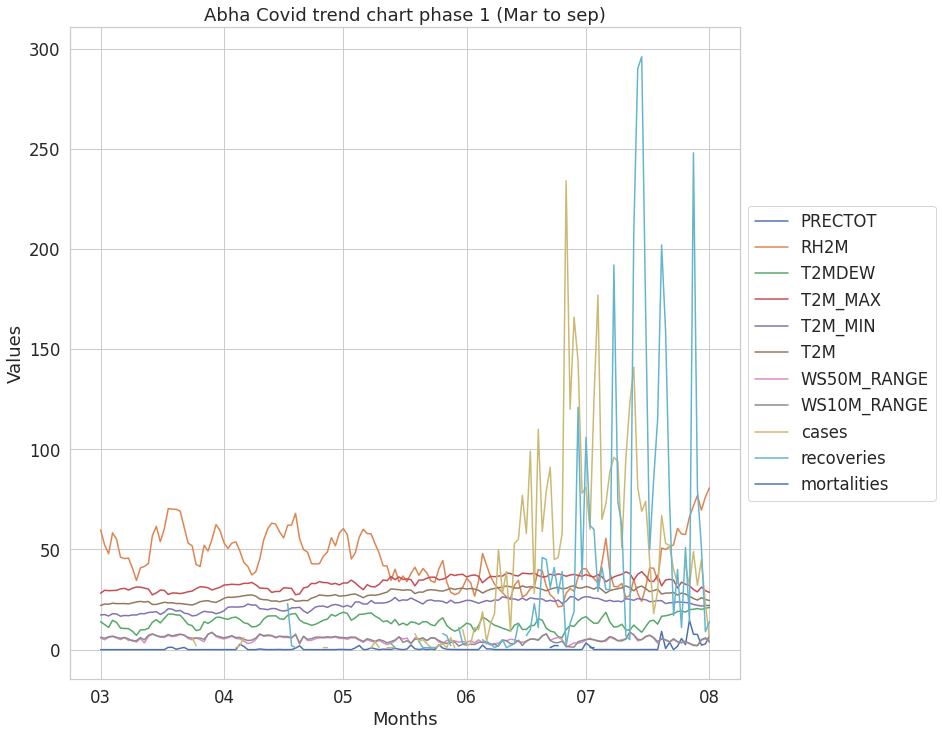

In [12]:
line_plot(phase1_abha, "Abha Covid trend chart phase 1 (Mar to sep)");

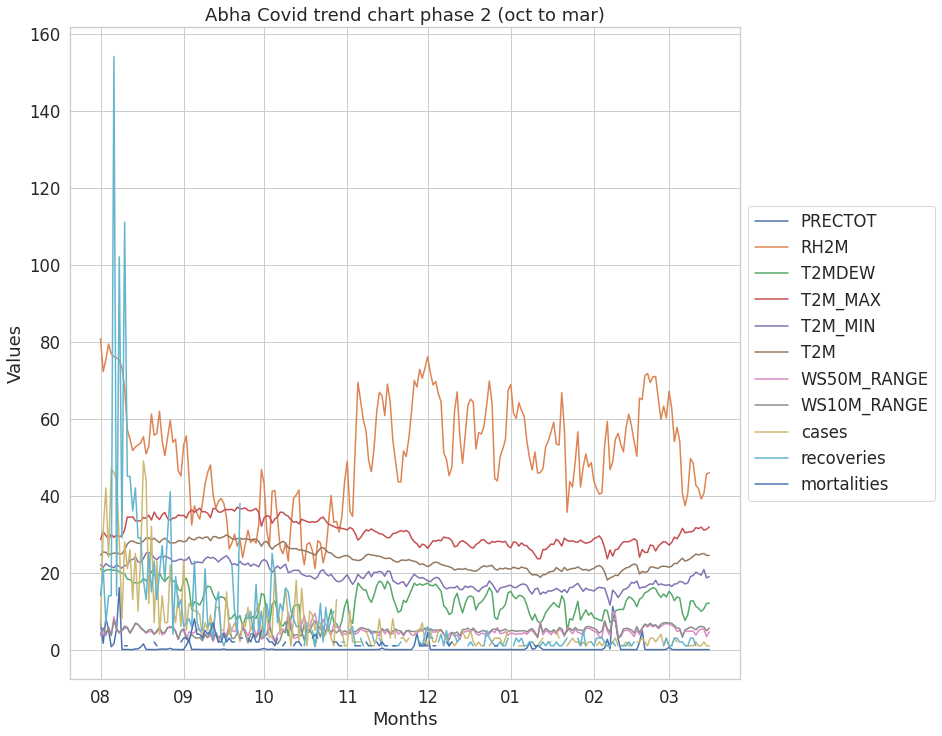

In [13]:
line_plot(phase2_abha, "Abha Covid trend chart phase 2 (oct to mar)");

<AxesSubplot:xlabel='cases', ylabel='RH2M'>

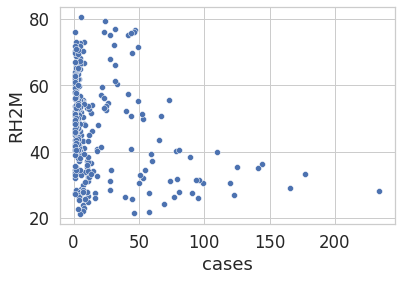

In [14]:
scatter_plot(df_abha, "cases", "RH2M")  

<AxesSubplot:xlabel='cases', ylabel='T2MDEW'>

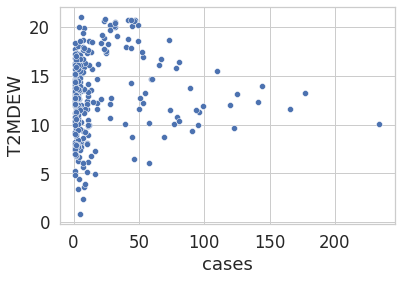

In [15]:
scatter_plot(df_abha, "cases", "T2MDEW")

<AxesSubplot:xlabel='cases', ylabel='T2M_MAX'>

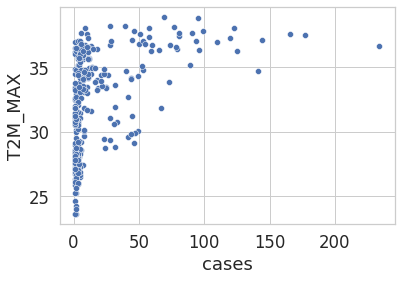

In [16]:
scatter_plot(df_abha, "cases", "T2M_MAX")  

<AxesSubplot:xlabel='cases', ylabel='T2M_MIN'>

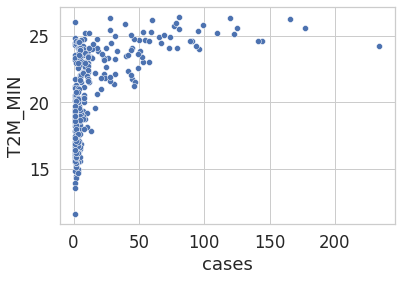

In [17]:
scatter_plot(df_abha, "cases", "T2M_MIN") 

<AxesSubplot:xlabel='cases', ylabel='T2M'>

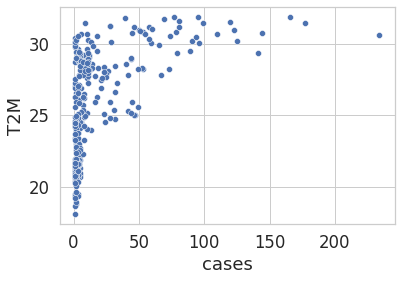

In [18]:
scatter_plot(df_abha, "cases", "T2M") 

<AxesSubplot:xlabel='cases', ylabel='WS50M_RANGE'>

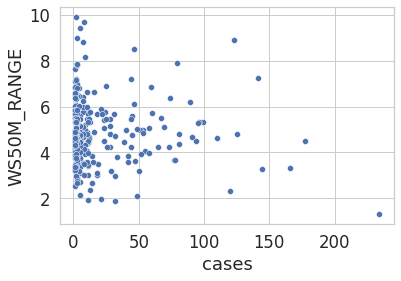

In [19]:
scatter_plot(df_abha, "cases", "WS50M_RANGE")

<AxesSubplot:xlabel='cases', ylabel='WS10M_RANGE'>

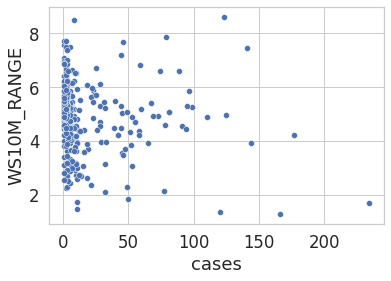

In [20]:
scatter_plot(df_abha, "cases", "WS10M_RANGE")

## Najran

In [21]:
df_najran

,PRECTOT,RH2M,T2MDEW,T2M_MAX,T2M_MIN,T2M,WS50M_RANGE,WS10M_RANGE,cases,recoveries,mortalities
DATE,,,,,,,,,,,
2020-03-01,0.0,34.52,6.41,32.42,14.90,22.99,3.96,2.54,NaN,NaN,NaN
2020-03-02,0.0,32.12,5.00,30.83,16.10,22.58,3.23,1.83,NaN,NaN,NaN
2020-03-03,0.0,22.55,-2.20,28.91,12.95,19.87,5.52,4.20,NaN,NaN,NaN
2020-03-04,0.0,28.32,1.33,30.01,12.72,20.40,2.94,3.30,NaN,NaN,NaN
2020-03-05,0.0,27.52,1.80,31.31,13.89,21.40,3.05,3.08,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-03-12,0.0,14.03,-5.87,33.47,13.98,23.13,4.41,2.17,2.0,4.0,NaN
2021-03-13,0.0,23.50,1.44,32.53,15.44,23.54,4.95,3.62,4.0,4.0,NaN
2021-03-14,0.0,17.30,-4.02,30.99,14.43,21.95,7.43,5.27,2.0,NaN,NaN


In [22]:
phase1_najran, phase2_najran = phase_mask(df_najran)

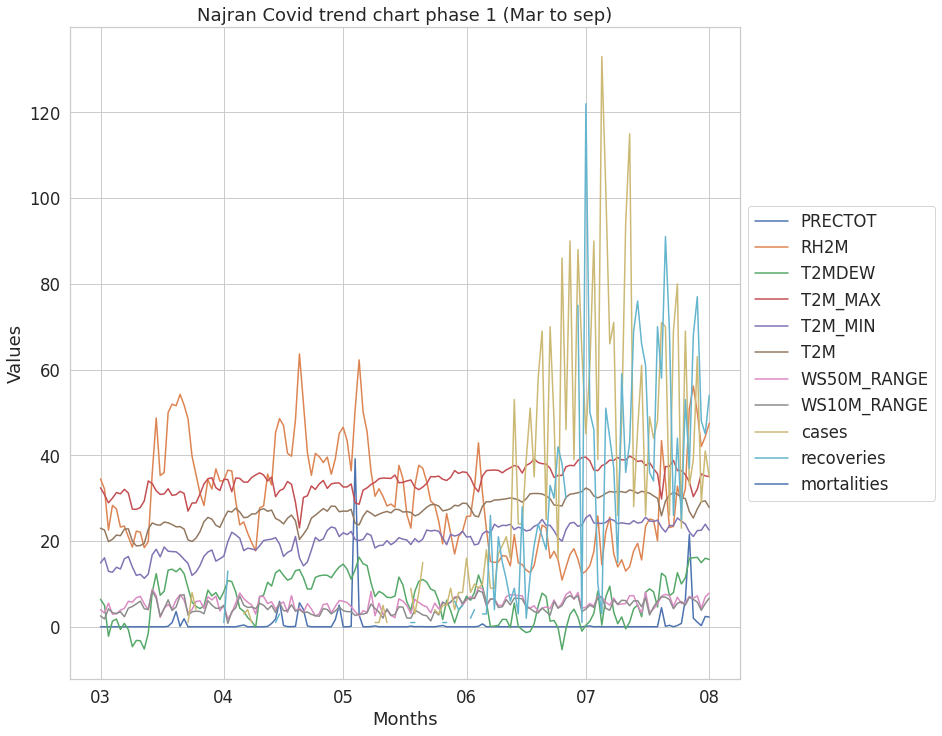

In [23]:
line_plot(phase1_najran, "Najran Covid trend chart phase 1 (Mar to sep)");

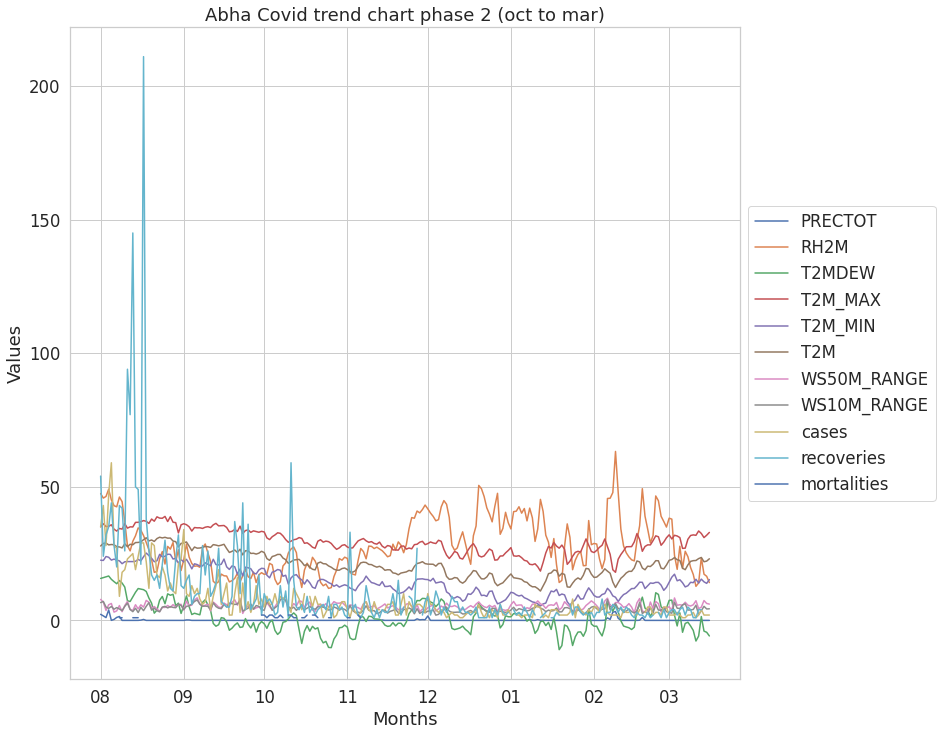

In [24]:
line_plot(phase2_najran, "Abha Covid trend chart phase 2 (oct to mar)");

<AxesSubplot:xlabel='cases', ylabel='RH2M'>

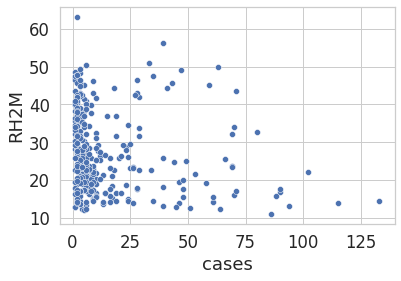

In [25]:
scatter_plot(df_najran, "cases", "RH2M")  

<AxesSubplot:xlabel='cases', ylabel='T2MDEW'>

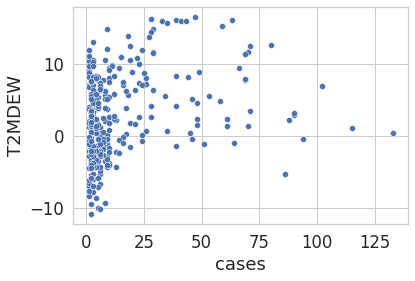

In [26]:
scatter_plot(df_najran, "cases", "T2MDEW")

<AxesSubplot:xlabel='cases', ylabel='T2M_MAX'>

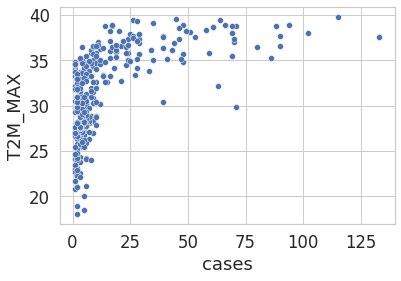

In [27]:
scatter_plot(df_najran, "cases", "T2M_MAX") 

<AxesSubplot:xlabel='cases', ylabel='T2M_MIN'>

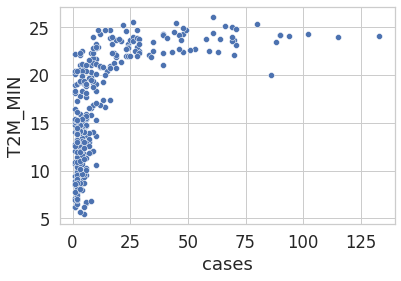

In [28]:
scatter_plot(df_najran, "cases", "T2M_MIN")

<AxesSubplot:xlabel='cases', ylabel='T2M'>

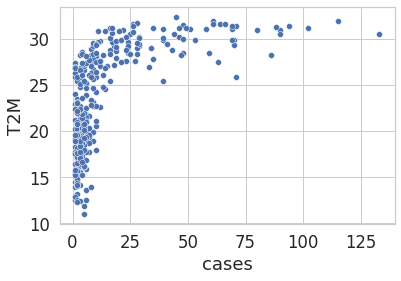

In [29]:
scatter_plot(df_najran, "cases", "T2M")

<AxesSubplot:xlabel='cases', ylabel='WS50M_RANGE'>

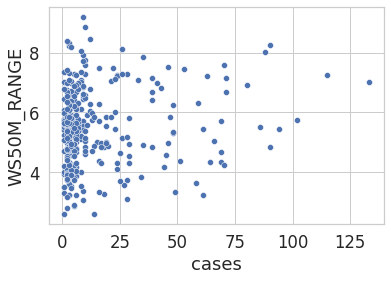

In [30]:
scatter_plot(df_najran, "cases", "WS50M_RANGE")

<AxesSubplot:xlabel='cases', ylabel='WS10M_RANGE'>

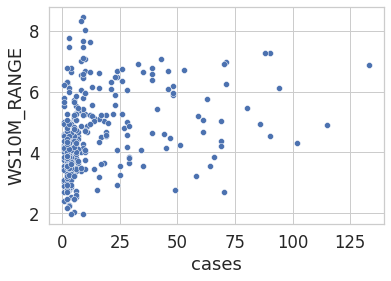

In [31]:
scatter_plot(df_najran, "cases", "WS10M_RANGE")

<AxesSubplot:xlabel='cases', ylabel='WS10M_RANGE'>

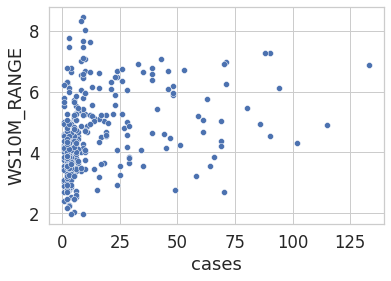

In [32]:
scatter_plot(df_najran, "cases", "WS10M_RANGE")

## Sharoura

In [33]:
df_sharoura

,PRECTOT,RH2M,T2MDEW,T2M_MAX,T2M_MIN,T2M,WS50M_RANGE,WS10M_RANGE,cases,recoveries,mortalities
DATE,,,,,,,,,,,
2020-03-01,0.0,21.62,1.00,33.92,15.40,24.38,7.26,5.14,NaN,NaN,NaN
2020-03-02,0.0,21.13,1.31,34.23,16.74,25.12,9.84,5.99,NaN,NaN,NaN
2020-03-03,0.0,20.16,-1.79,29.65,15.20,22.16,5.58,2.95,NaN,NaN,NaN
2020-03-04,0.0,23.99,0.18,29.44,14.69,21.71,5.90,3.53,NaN,NaN,NaN
2020-03-05,0.0,18.17,-3.19,30.37,14.64,22.16,7.26,3.58,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-03-12,0.0,16.70,-2.00,34.35,16.21,25.03,8.85,5.43,NaN,NaN,NaN
2021-03-13,0.0,19.16,-0.39,35.32,15.35,24.69,9.28,5.53,NaN,1.0,NaN
2021-03-14,0.0,24.36,2.22,33.86,14.92,23.87,8.21,4.28,NaN,NaN,NaN


In [34]:
phase1_sharoura, phase2_sharoura = phase_mask(df_sharoura)

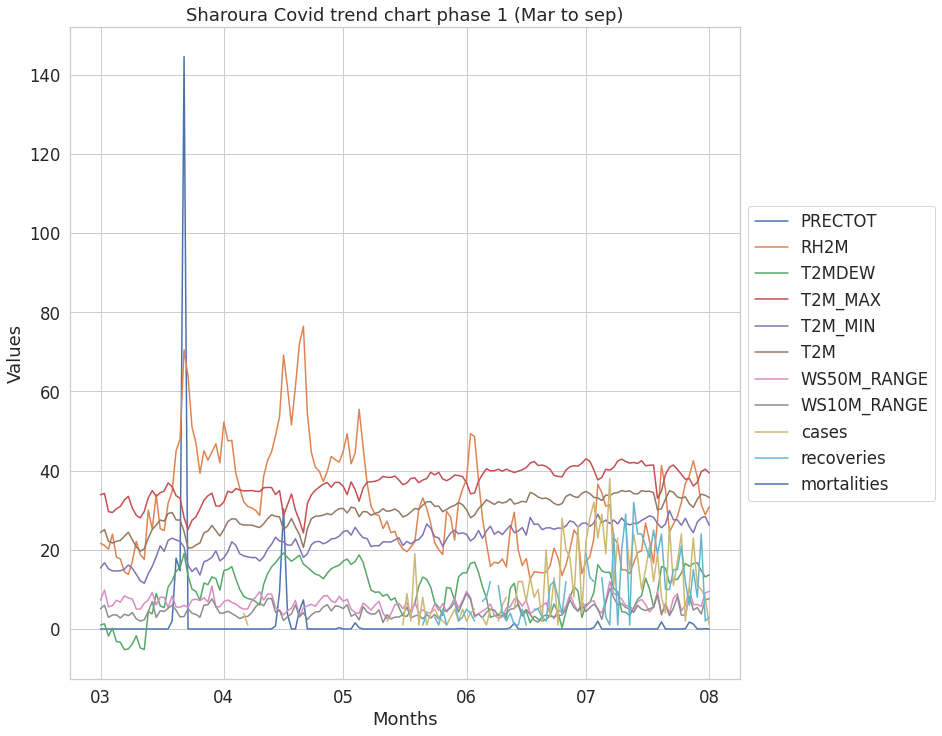

In [35]:
line_plot(phase1_sharoura, "Sharoura Covid trend chart phase 1 (Mar to sep)");

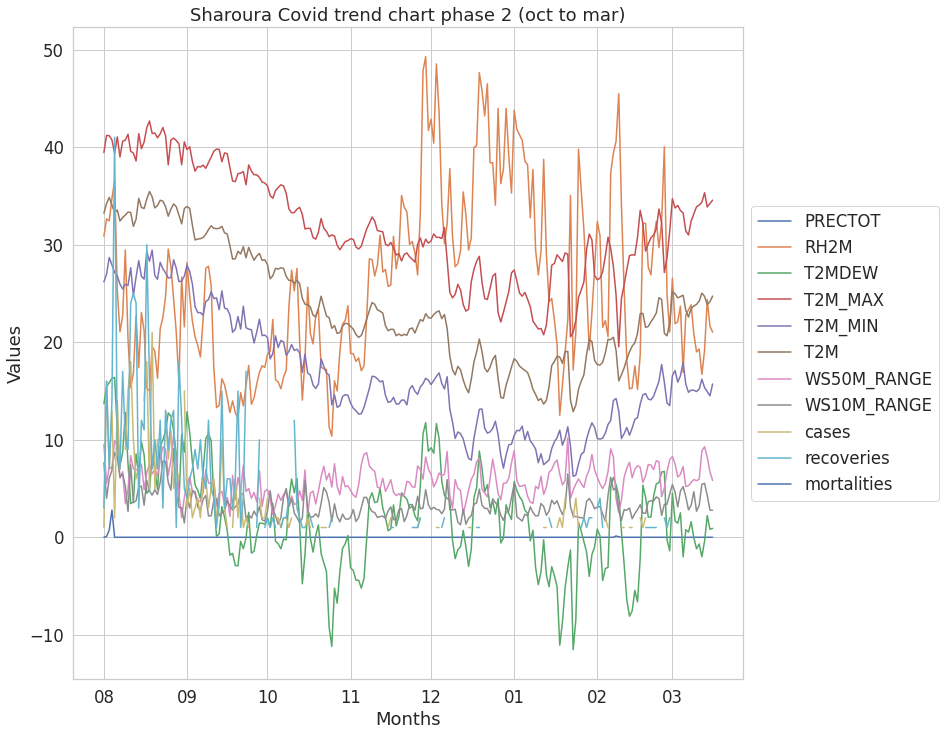

In [36]:
line_plot(phase2_sharoura, "Sharoura Covid trend chart phase 2 (oct to mar)");

<AxesSubplot:xlabel='cases', ylabel='RH2M'>

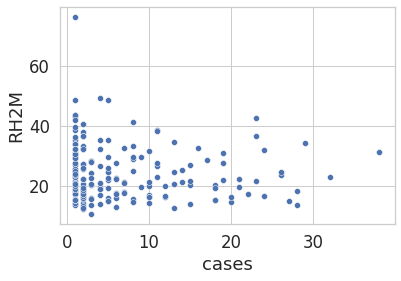

In [37]:
scatter_plot(df_sharoura, "cases", "RH2M")  

<AxesSubplot:xlabel='cases', ylabel='T2MDEW'>

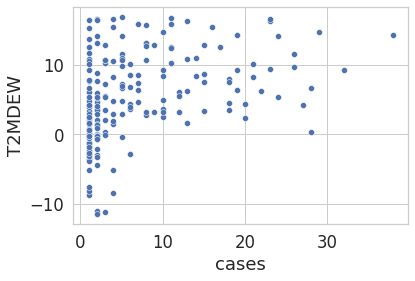

In [38]:
scatter_plot(df_sharoura, "cases", "T2MDEW")

<AxesSubplot:xlabel='cases', ylabel='T2M_MAX'>

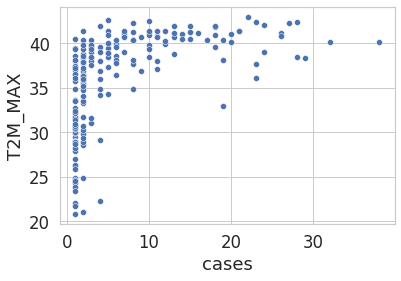

In [39]:
scatter_plot(df_sharoura, "cases", "T2M_MAX") 

<AxesSubplot:xlabel='cases', ylabel='T2M_MIN'>

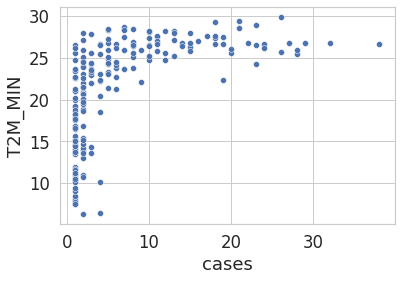

In [40]:
scatter_plot(df_sharoura, "cases", "T2M_MIN") 

<AxesSubplot:xlabel='cases', ylabel='T2M'>

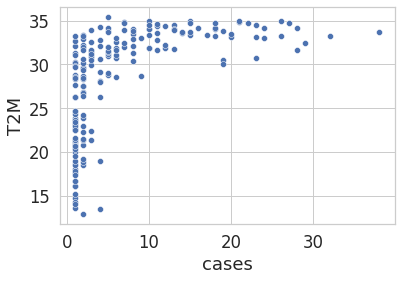

In [41]:
scatter_plot(df_sharoura, "cases", "T2M") 

<AxesSubplot:xlabel='cases', ylabel='WS50M_RANGE'>

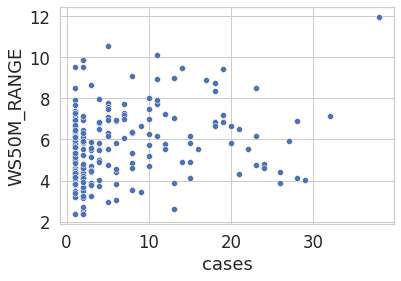

In [42]:
scatter_plot(df_sharoura, "cases", "WS50M_RANGE")

<AxesSubplot:xlabel='cases', ylabel='WS10M_RANGE'>

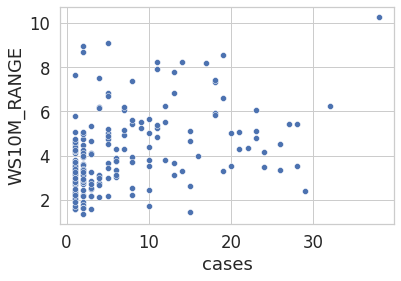

In [43]:
scatter_plot(df_sharoura, "cases", "WS10M_RANGE")

## Qurayat

In [44]:
df_qurayat

,PRECTOT,RH2M,T2MDEW,T2M_MAX,T2M_MIN,T2M,WS50M_RANGE,WS10M_RANGE,cases,recoveries,mortalities
DATE,,,,,,,,,,,
2020-03-01,2.99,67.30,4.53,16.41,5.23,10.26,9.76,10.20,NaN,NaN,NaN
2020-03-02,0.00,65.50,4.06,18.04,4.28,10.17,3.84,2.01,NaN,NaN,NaN
2020-03-03,0.00,52.39,2.74,20.89,5.02,12.19,4.36,2.52,NaN,NaN,NaN
2020-03-04,0.00,38.63,-0.35,24.22,4.68,13.58,3.99,3.95,NaN,NaN,NaN
2020-03-05,0.00,36.49,0.13,27.08,4.71,15.02,6.12,3.76,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-03-12,0.52,57.67,4.71,18.40,6.38,12.80,12.05,11.35,1.0,1.0,NaN
2021-03-13,0.00,43.77,0.31,20.52,4.69,12.37,5.24,2.16,1.0,2.0,NaN
2021-03-14,0.00,29.19,-2.04,25.83,6.55,16.02,2.19,1.28,1.0,NaN,NaN


In [45]:
phase1_qurayat, phase2_qurayat = phase_mask(df_qurayat)

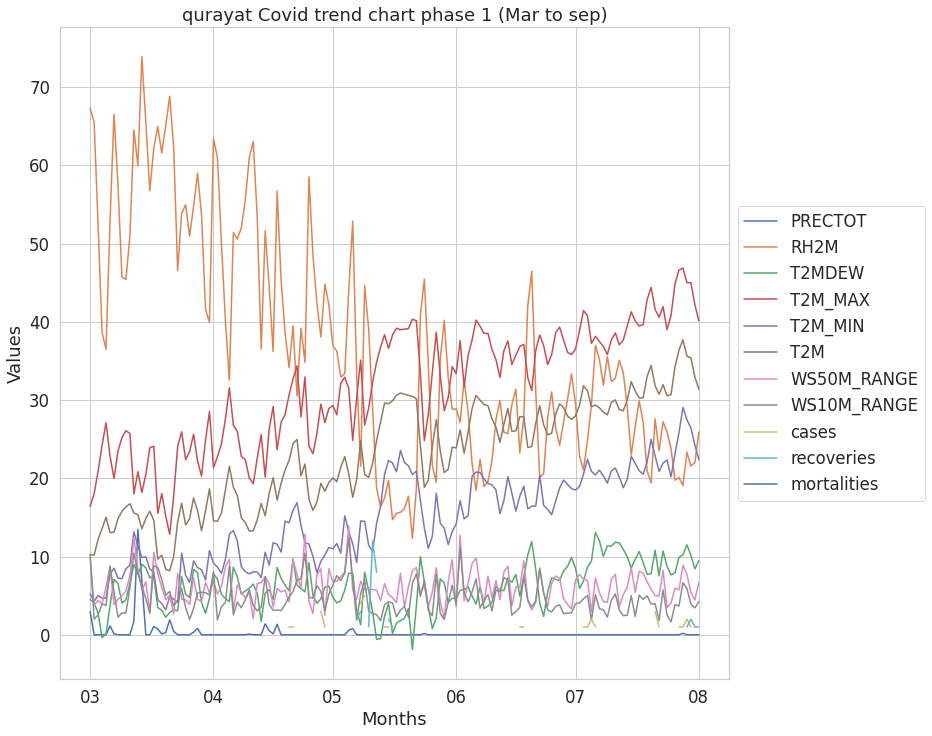

In [46]:
line_plot(phase1_qurayat, "qurayat Covid trend chart phase 1 (Mar to sep)");


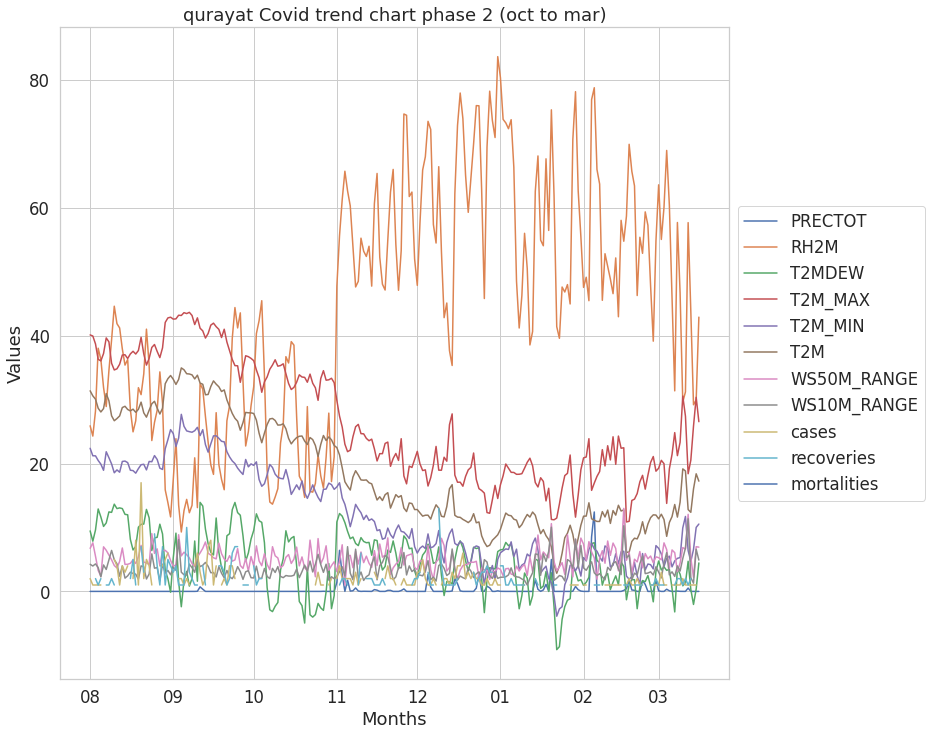

In [47]:
line_plot(phase2_qurayat, "qurayat Covid trend chart phase 2 (oct to mar)");

<AxesSubplot:xlabel='cases', ylabel='RH2M'>

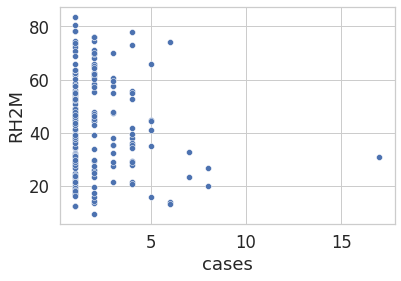

In [48]:
scatter_plot(df_qurayat, "cases", "RH2M")  

<AxesSubplot:xlabel='cases', ylabel='T2MDEW'>

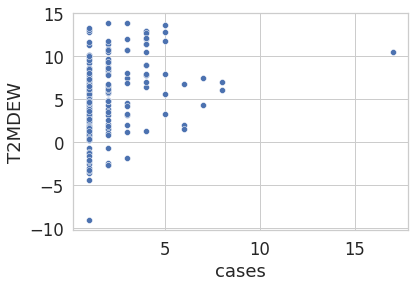

In [49]:
scatter_plot(df_qurayat, "cases", "T2MDEW")

<AxesSubplot:xlabel='cases', ylabel='T2M_MAX'>

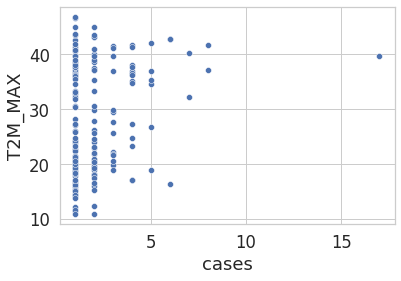

In [50]:
scatter_plot(df_qurayat, "cases", "T2M_MAX") 

<AxesSubplot:xlabel='cases', ylabel='T2M_MIN'>

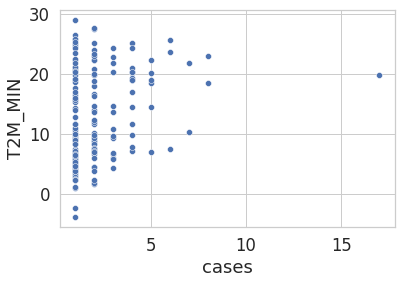

In [51]:
scatter_plot(df_qurayat, "cases", "T2M_MIN")

<AxesSubplot:xlabel='cases', ylabel='T2M'>

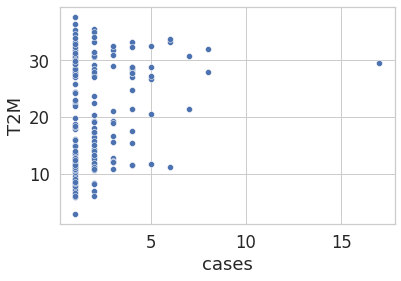

In [52]:
scatter_plot(df_qurayat, "cases", "T2M")

<AxesSubplot:xlabel='cases', ylabel='WS50M_RANGE'>

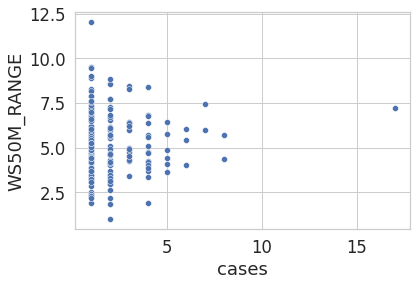

In [53]:
scatter_plot(df_qurayat, "cases", "WS50M_RANGE")

<AxesSubplot:xlabel='cases', ylabel='WS10M_RANGE'>

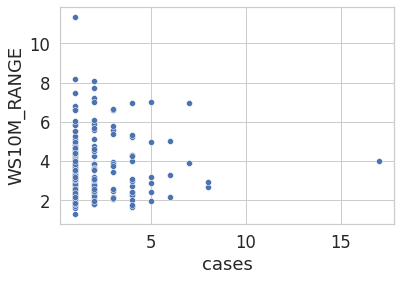

In [54]:
scatter_plot(df_qurayat, "cases", "WS10M_RANGE")

## Tabuk

In [55]:
df_tabuk

,PRECTOT,RH2M,T2MDEW,T2M_MAX,T2M_MIN,T2M,WS50M_RANGE,WS10M_RANGE,cases,recoveries,mortalities
DATE,,,,,,,,,,,
2020-03-01,0.0,42.96,-1.25,20.00,4.71,10.94,2.92,3.79,NaN,NaN,NaN
2020-03-02,0.0,32.82,-3.32,24.15,2.56,12.76,5.71,4.01,NaN,NaN,NaN
2020-03-03,0.0,19.86,-8.05,26.27,5.07,14.85,7.88,3.39,NaN,NaN,NaN
2020-03-04,0.0,14.79,-10.04,29.01,6.66,17.04,6.64,3.81,NaN,NaN,NaN
2020-03-05,0.0,16.22,-8.13,28.30,9.80,17.92,6.24,6.10,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-03-12,0.0,32.71,-0.89,21.71,7.91,15.57,7.51,8.36,1.0,6.0,NaN
2021-03-13,0.0,32.40,-1.80,26.12,4.43,14.69,7.01,5.12,2.0,1.0,1.0
2021-03-14,0.0,18.06,-6.17,29.57,8.41,18.62,7.91,4.35,2.0,2.0,NaN


In [56]:
phase1_tabuk, phase2_tabuk = phase_mask(df_tabuk)

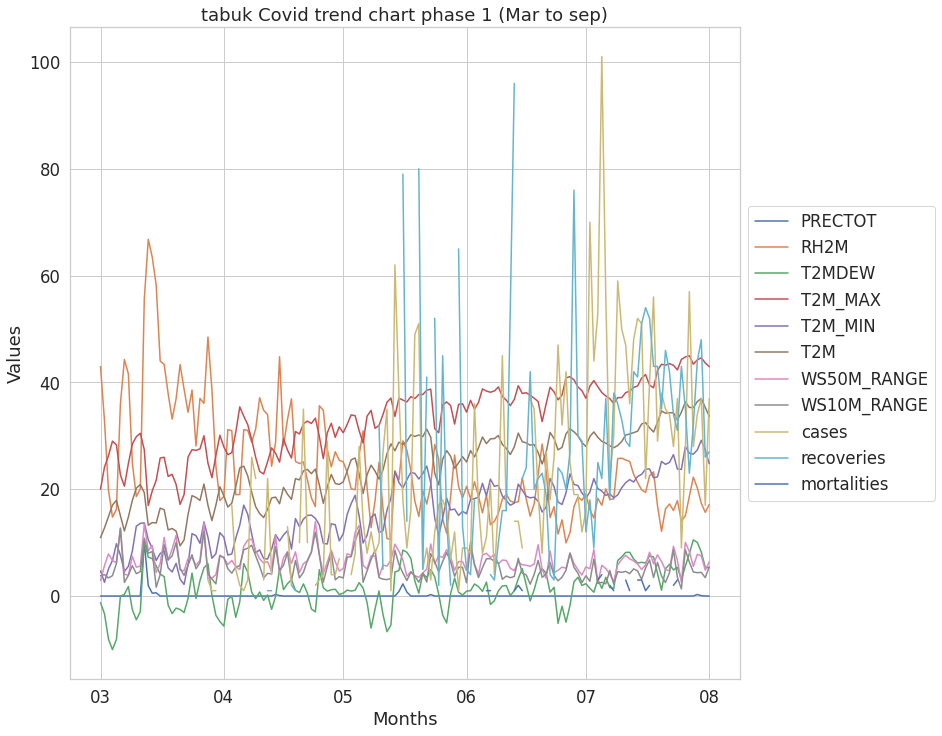

In [57]:
line_plot(phase1_tabuk, "tabuk Covid trend chart phase 1 (Mar to sep)");

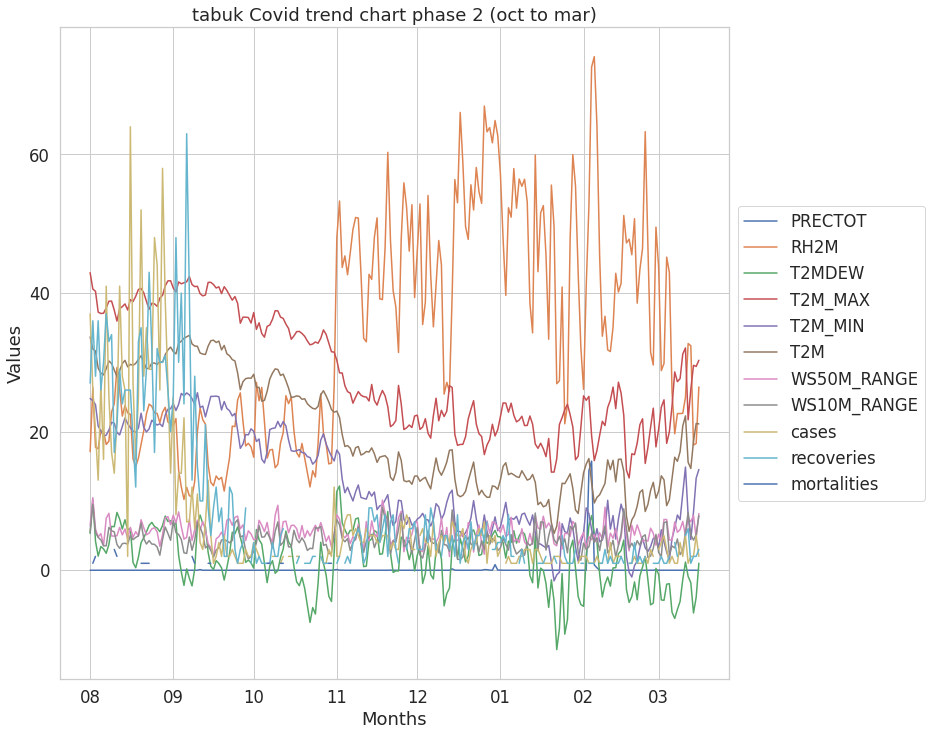

In [58]:
line_plot(phase2_tabuk, "tabuk Covid trend chart phase 2 (oct to mar)");

<AxesSubplot:xlabel='cases', ylabel='RH2M'>

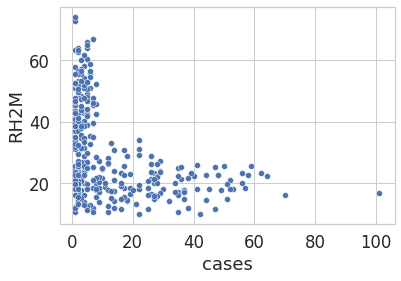

In [59]:
scatter_plot(df_tabuk, "cases", "RH2M")  

<AxesSubplot:xlabel='cases', ylabel='T2MDEW'>

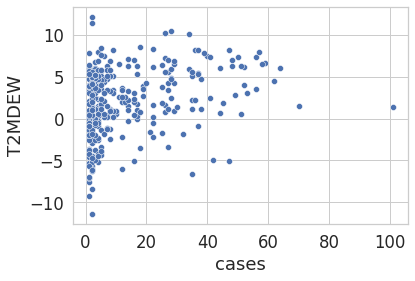

In [60]:
scatter_plot(df_tabuk, "cases", "T2MDEW")

<AxesSubplot:xlabel='cases', ylabel='T2M_MAX'>

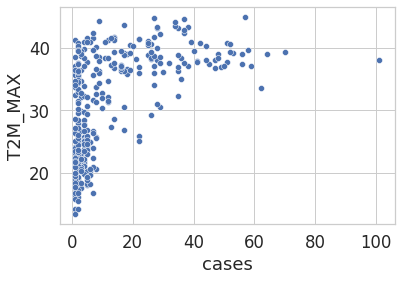

In [61]:
scatter_plot(df_tabuk, "cases", "T2M_MAX")  

<AxesSubplot:xlabel='cases', ylabel='T2M_MIN'>

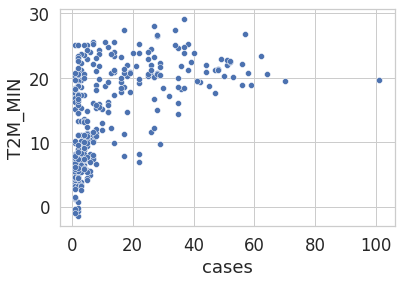

In [62]:
scatter_plot(df_tabuk, "cases", "T2M_MIN")

<AxesSubplot:xlabel='cases', ylabel='T2M'>

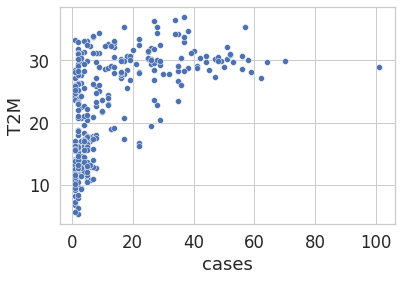

In [63]:
scatter_plot(df_tabuk, "cases", "T2M") 

<AxesSubplot:xlabel='cases', ylabel='WS50M_RANGE'>

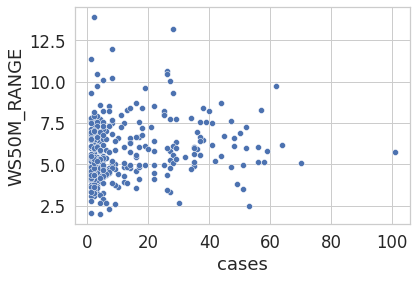

In [64]:
scatter_plot(df_tabuk, "cases", "WS50M_RANGE")

<AxesSubplot:xlabel='cases', ylabel='WS10M_RANGE'>

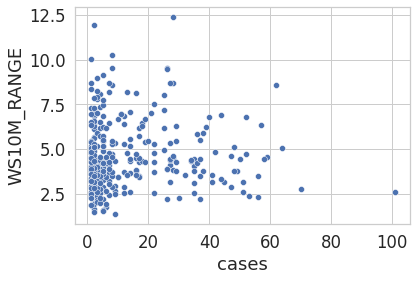

In [65]:
scatter_plot(df_tabuk, "cases", "WS10M_RANGE")

## Hail

In [66]:
df_hail

,PRECTOT,RH2M,T2MDEW,T2M_MAX,T2M_MIN,T2M,WS50M_RANGE,WS10M_RANGE,cases,recoveries,mortalities
DATE,,,,,,,,,,,
2020-03-01,0.00,33.12,-3.19,20.91,6.38,12.77,7.19,6.64,NaN,NaN,NaN
2020-03-02,0.00,36.02,-3.44,20.67,3.55,11.21,4.80,2.38,NaN,NaN,NaN
2020-03-03,0.00,25.36,-6.48,23.44,4.89,13.01,6.68,3.31,NaN,NaN,NaN
2020-03-04,0.00,23.79,-6.42,24.95,4.88,14.05,7.80,3.48,NaN,NaN,NaN
2020-03-05,0.00,22.14,-4.30,28.66,7.98,17.66,6.87,5.86,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-03-12,0.00,33.74,0.99,24.07,9.78,17.22,9.79,10.70,4.0,5.0,NaN
2021-03-13,0.00,38.65,-0.95,21.74,5.86,12.91,7.60,3.58,3.0,5.0,NaN
2021-03-14,0.00,32.36,0.09,27.85,6.71,16.86,6.67,4.11,5.0,2.0,NaN


In [67]:
phase1_hail, phase2_hail = phase_mask(df_hail)

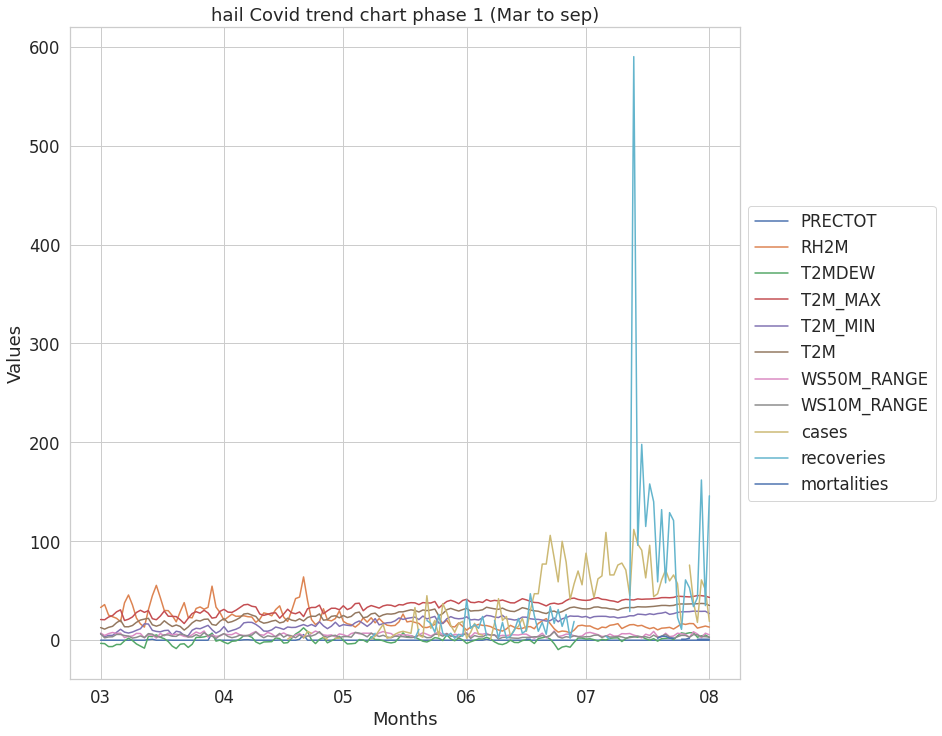

In [68]:
line_plot(phase1_hail, "hail Covid trend chart phase 1 (Mar to sep)");

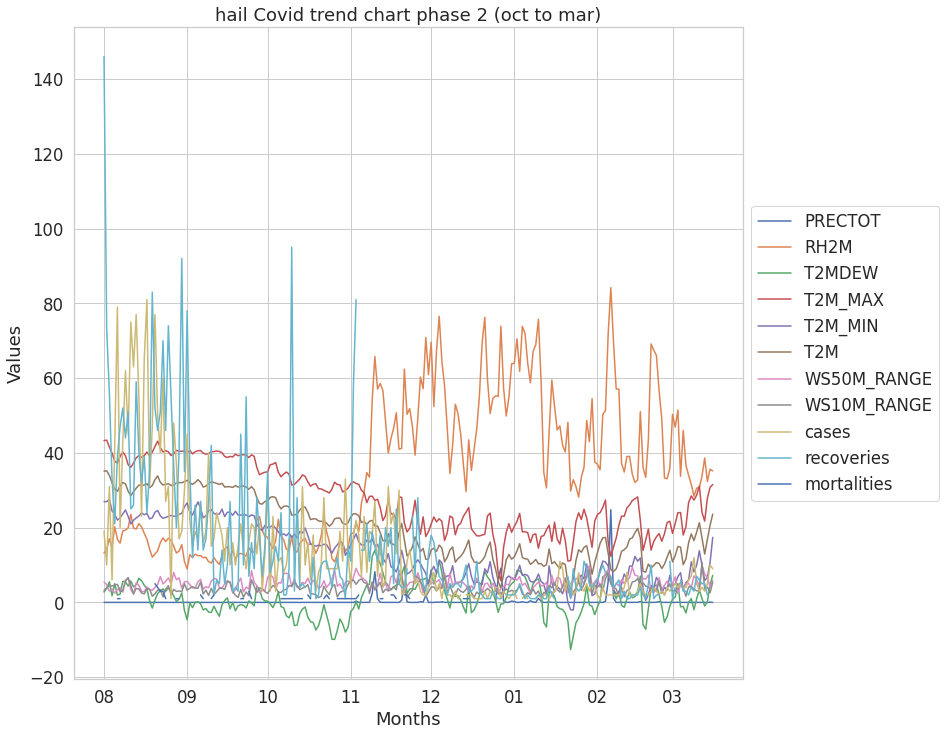

In [69]:
line_plot(phase2_hail, "hail Covid trend chart phase 2 (oct to mar)");

<AxesSubplot:xlabel='cases', ylabel='RH2M'>

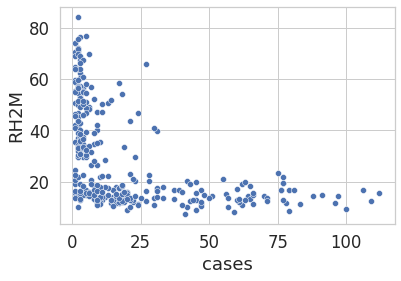

In [70]:
scatter_plot(df_hail, "cases", "RH2M")  

<AxesSubplot:xlabel='cases', ylabel='T2MDEW'>

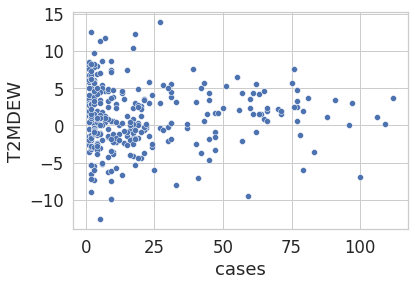

In [71]:
scatter_plot(df_hail, "cases", "T2MDEW")

<AxesSubplot:xlabel='cases', ylabel='T2M_MAX'>

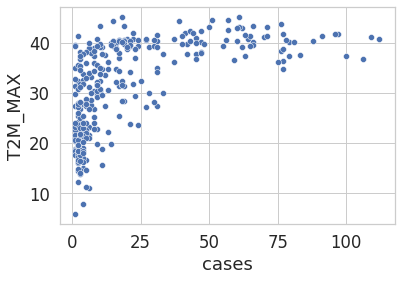

In [72]:
scatter_plot(df_hail, "cases", "T2M_MAX")

<AxesSubplot:xlabel='cases', ylabel='T2M_MIN'>

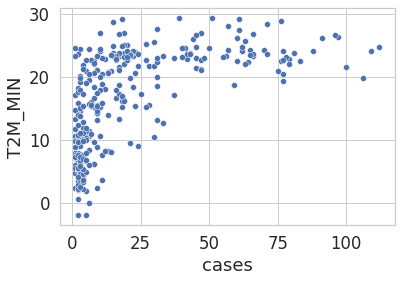

In [73]:
scatter_plot(df_hail, "cases", "T2M_MIN")

<AxesSubplot:xlabel='cases', ylabel='T2M'>

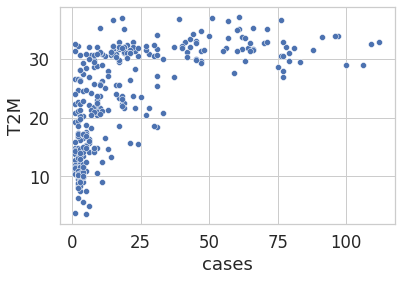

In [74]:
scatter_plot(df_hail, "cases", "T2M") 

<AxesSubplot:xlabel='cases', ylabel='WS50M_RANGE'>

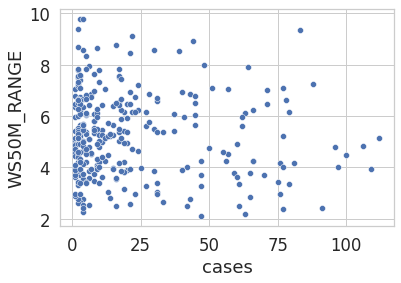

In [75]:
scatter_plot(df_hail, "cases", "WS50M_RANGE")

<AxesSubplot:xlabel='cases', ylabel='WS10M_RANGE'>

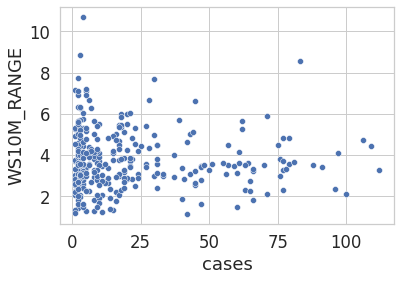

In [76]:
scatter_plot(df_hail, "cases", "WS10M_RANGE")

## Jeddah

In [77]:
df_jed

,PRECTOT,RH2M,T2MDEW,T2M_MAX,T2M_MIN,T2M,WS50M_RANGE,WS10M_RANGE,cases,recoveries,mortalities
DATE,,,,,,,,,,,
2020-03-01,0.00,48.15,11.92,29.32,19.00,23.50,3.67,4.46,NaN,NaN,NaN
2020-03-02,0.00,38.98,9.70,33.63,18.50,24.65,5.93,4.89,NaN,NaN,NaN
2020-03-03,0.00,40.45,10.85,31.53,19.86,25.30,3.59,2.28,NaN,NaN,NaN
2020-03-04,0.00,55.89,16.73,31.26,22.77,26.11,4.45,4.28,NaN,NaN,NaN
2020-03-05,0.00,59.42,17.90,31.62,22.83,26.32,3.34,3.64,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-03-12,0.00,45.67,15.76,34.64,24.03,28.60,3.53,2.92,13.0,20.0,1.0
2021-03-13,0.00,48.82,15.97,33.96,22.58,27.65,4.70,3.41,29.0,20.0,1.0
2021-03-14,0.00,47.49,15.82,33.67,23.95,27.97,5.19,4.84,11.0,17.0,1.0


In [78]:
phase1_jed, phase2_jed = phase_mask(df_jed)

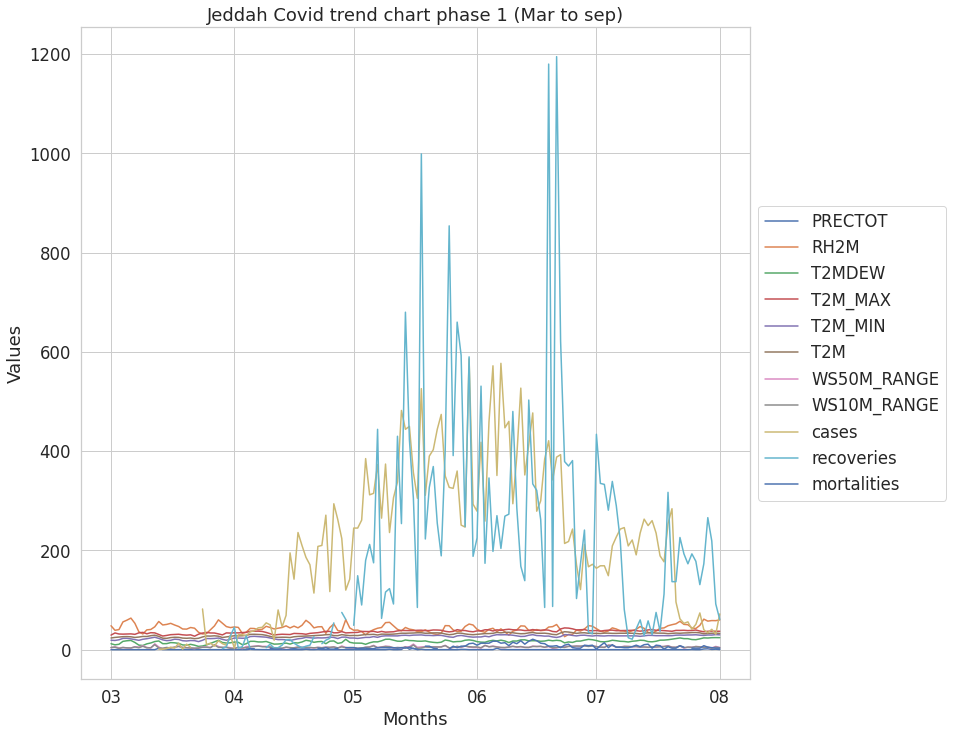

In [79]:
line_plot(phase1_jed, "Jeddah Covid trend chart phase 1 (Mar to sep)");

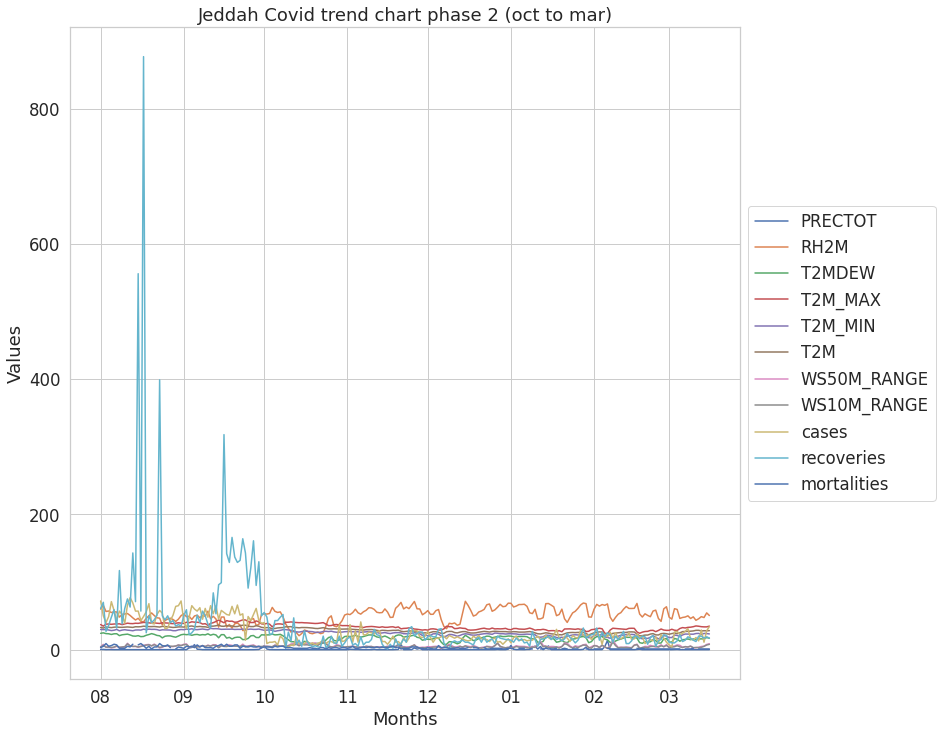

In [80]:
line_plot(phase2_jed, "Jeddah Covid trend chart phase 2 (oct to mar)");

<AxesSubplot:xlabel='cases', ylabel='RH2M'>

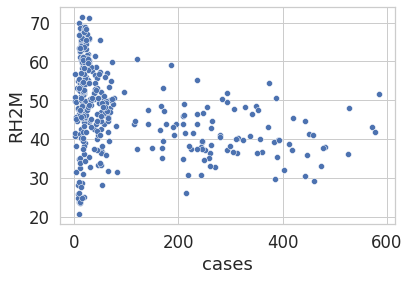

In [81]:
scatter_plot(df_jed, "cases", "RH2M") 

<AxesSubplot:xlabel='cases', ylabel='T2MDEW'>

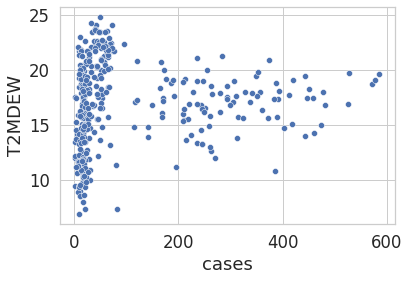

In [82]:
scatter_plot(df_jed, "cases", "T2MDEW")

<AxesSubplot:xlabel='cases', ylabel='T2M_MAX'>

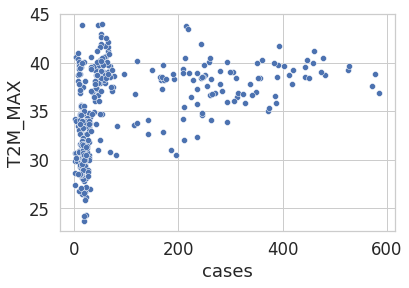

In [83]:
scatter_plot(df_jed, "cases", "T2M_MAX") 

<AxesSubplot:xlabel='cases', ylabel='T2M_MIN'>

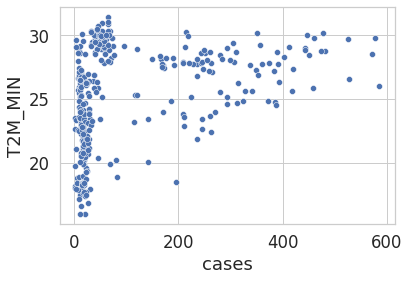

In [84]:
scatter_plot(df_jed, "cases", "T2M_MIN") 

<AxesSubplot:xlabel='cases', ylabel='T2M'>

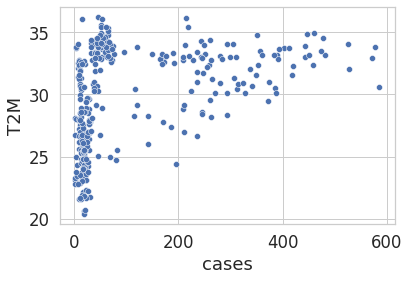

In [85]:
scatter_plot(df_jed, "cases", "T2M") 

<AxesSubplot:xlabel='cases', ylabel='WS50M_RANGE'>

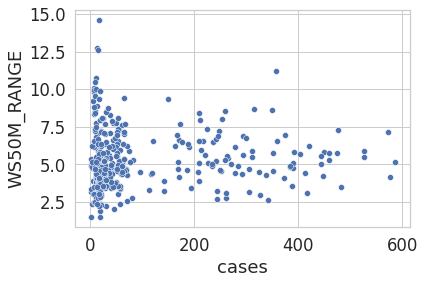

In [86]:
scatter_plot(df_jed, "cases", "WS50M_RANGE")

<AxesSubplot:xlabel='cases', ylabel='WS10M_RANGE'>

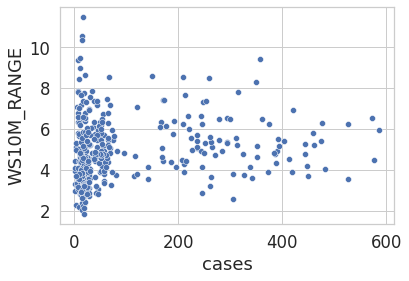

In [87]:
scatter_plot(df_jed, "cases", "WS10M_RANGE")

## Makkah

In [88]:
df_mak

,PRECTOT,RH2M,T2MDEW,T2M_MAX,T2M_MIN,T2M,WS50M_RANGE,WS10M_RANGE,cases,recoveries,mortalities
DATE,,,,,,,,,,,
2020-03-01,0.0,37.99,8.54,31.40,18.28,23.79,4.30,5.14,NaN,NaN,NaN
2020-03-02,0.0,26.15,3.71,33.99,17.44,24.45,5.01,3.40,NaN,NaN,NaN
2020-03-03,0.0,34.03,8.42,33.07,19.27,25.51,5.11,4.52,NaN,NaN,NaN
2020-03-04,0.0,54.95,16.00,31.64,21.50,25.63,5.25,5.58,NaN,NaN,NaN
2020-03-05,0.0,56.52,16.34,32.17,20.69,25.52,2.45,3.62,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-03-12,0.0,37.53,12.17,35.14,22.97,28.07,2.61,3.61,16.0,38.0,NaN
2021-03-13,0.0,38.93,12.30,34.93,21.66,27.57,4.27,4.43,19.0,19.0,NaN
2021-03-14,0.0,40.34,12.84,34.46,22.26,27.55,7.34,7.02,20.0,7.0,NaN


In [89]:
phase1_mak, phase2_mak = phase_mask(df_mak)

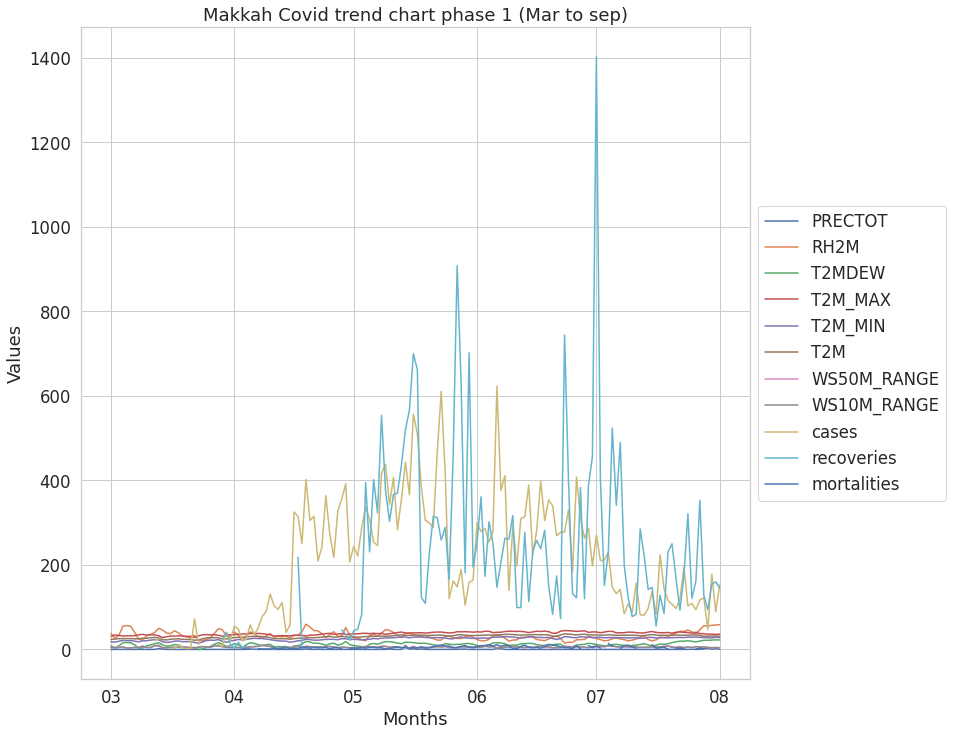

In [90]:
line_plot(phase1_mak, "Makkah Covid trend chart phase 1 (Mar to sep)");

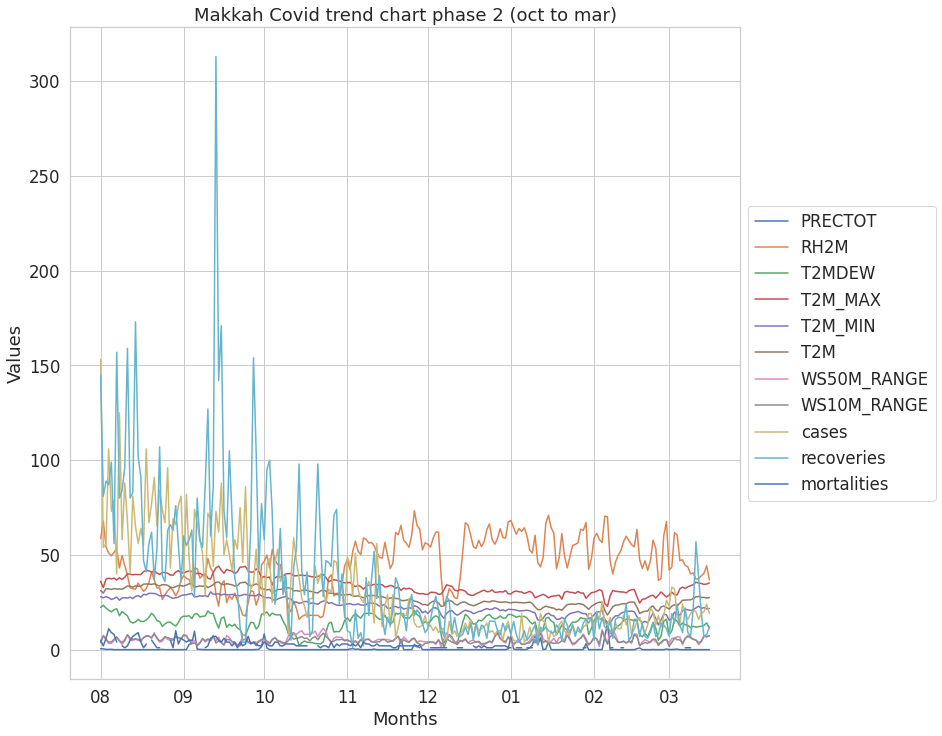

In [91]:
line_plot(phase2_mak, "Makkah Covid trend chart phase 2 (oct to mar)");

<AxesSubplot:xlabel='cases', ylabel='RH2M'>

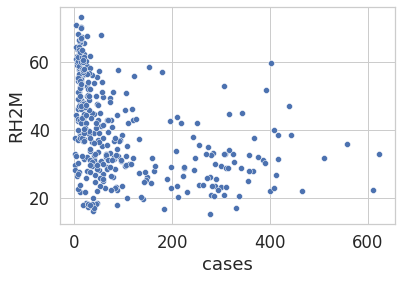

In [92]:
scatter_plot(df_mak, "cases", "RH2M")  

<AxesSubplot:xlabel='cases', ylabel='T2MDEW'>

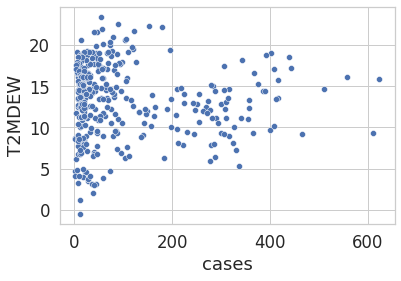

In [93]:
scatter_plot(df_mak, "cases", "T2MDEW")

<AxesSubplot:xlabel='cases', ylabel='T2M_MAX'>

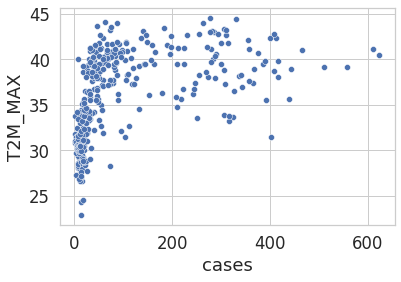

In [94]:
scatter_plot(df_mak, "cases", "T2M_MAX")  

<AxesSubplot:xlabel='cases', ylabel='T2M_MIN'>

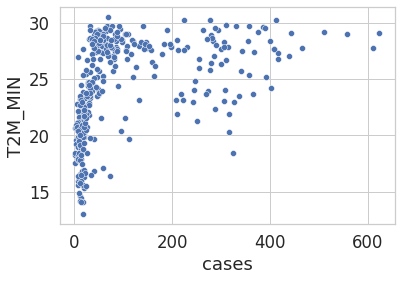

In [95]:
scatter_plot(df_mak, "cases", "T2M_MIN")

<AxesSubplot:xlabel='cases', ylabel='T2M'>

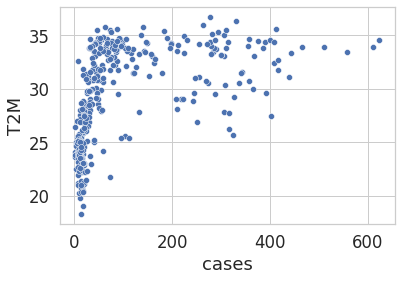

In [96]:
scatter_plot(df_mak, "cases", "T2M") 

<AxesSubplot:xlabel='cases', ylabel='WS50M_RANGE'>

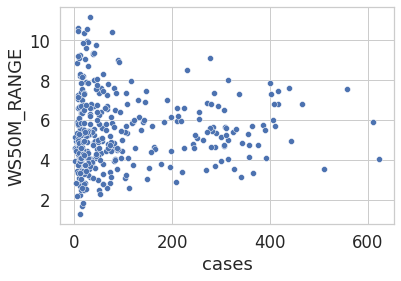

In [97]:
scatter_plot(df_mak, "cases", "WS50M_RANGE")

<AxesSubplot:xlabel='cases', ylabel='WS10M_RANGE'>

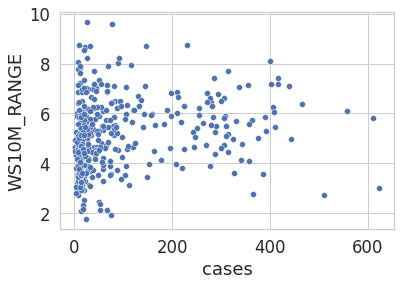

In [98]:
scatter_plot(df_mak, "cases", "WS10M_RANGE")

## Taif

In [99]:
df_taif

,PRECTOT,RH2M,T2MDEW,T2M_MAX,T2M_MIN,T2M,WS50M_RANGE,WS10M_RANGE,cases,recoveries,mortalities
DATE,,,,,,,,,,,
2020-03-01,0.0,33.95,5.03,30.64,15.82,21.70,6.46,6.39,NaN,NaN,NaN
2020-03-02,0.0,17.35,-3.79,32.29,14.39,22.18,4.14,4.20,NaN,NaN,NaN
2020-03-03,0.0,28.32,3.91,32.37,16.46,23.38,9.46,7.41,NaN,NaN,NaN
2020-03-04,0.0,53.15,13.24,30.48,17.65,23.24,7.18,7.10,NaN,NaN,NaN
2020-03-05,0.0,53.85,13.30,31.21,16.99,23.08,3.78,4.26,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-03-12,0.0,34.60,8.79,33.68,19.97,25.65,5.68,5.92,2.0,2.0,NaN
2021-03-13,0.0,32.87,7.76,33.63,19.10,25.35,5.84,5.90,NaN,1.0,NaN
2021-03-14,0.0,35.88,9.01,33.25,18.87,25.28,6.08,6.33,1.0,1.0,1.0


In [100]:
phase1_taif, phase2_taif = phase_mask(df_taif)

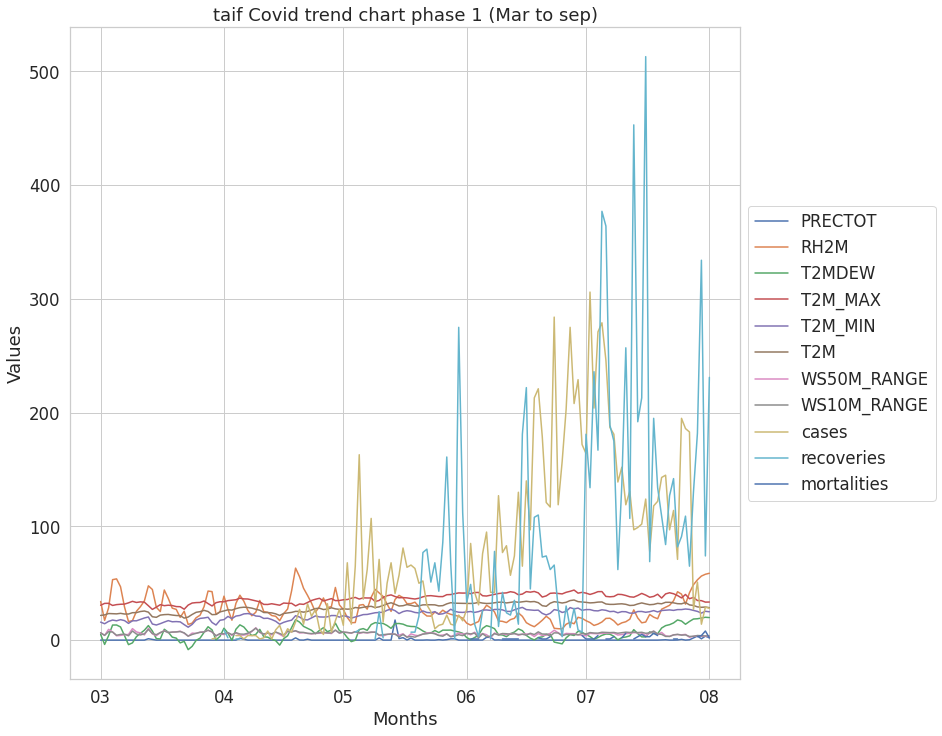

In [101]:
line_plot(phase1_taif, "taif Covid trend chart phase 1 (Mar to sep)");

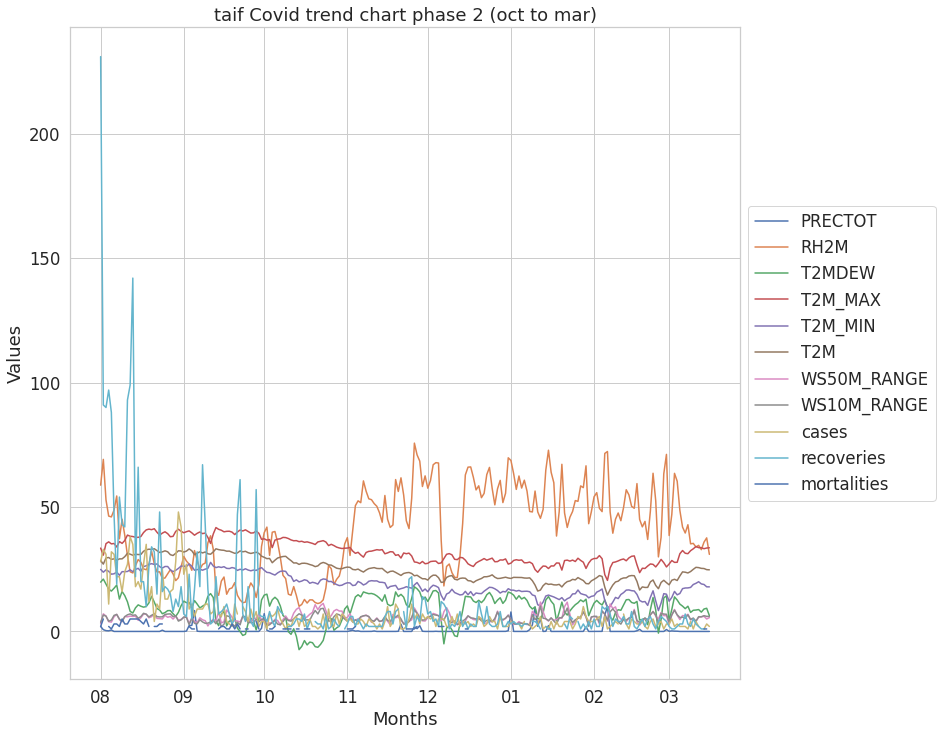

In [102]:
line_plot(phase2_taif, "taif Covid trend chart phase 2 (oct to mar)");

<AxesSubplot:xlabel='cases', ylabel='RH2M'>

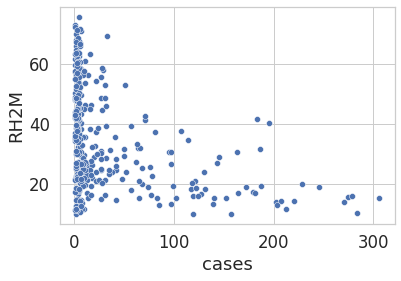

In [103]:
scatter_plot(df_taif, "cases", "RH2M")  

<AxesSubplot:xlabel='cases', ylabel='T2MDEW'>

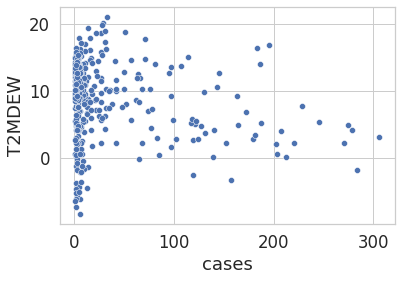

In [104]:
scatter_plot(df_taif, "cases", "T2MDEW")

<AxesSubplot:xlabel='cases', ylabel='T2M_MAX'>

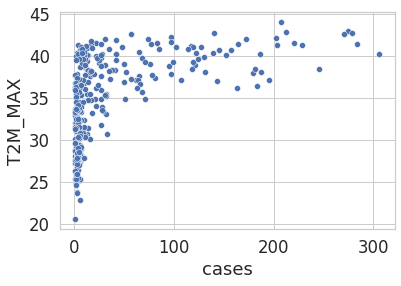

In [105]:
scatter_plot(df_taif, "cases", "T2M_MAX")

<AxesSubplot:xlabel='cases', ylabel='T2M_MIN'>

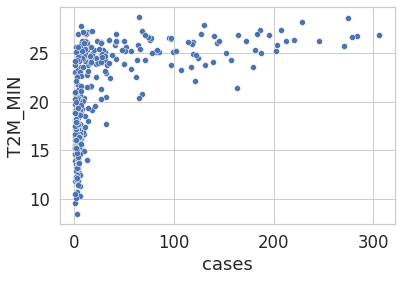

In [106]:
scatter_plot(df_taif, "cases", "T2M_MIN")

<AxesSubplot:xlabel='cases', ylabel='T2M'>

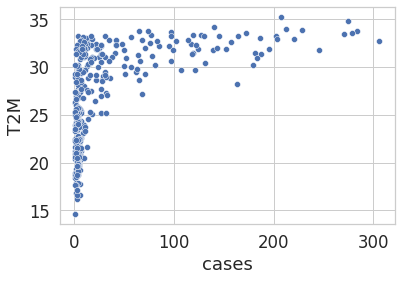

In [107]:
scatter_plot(df_taif, "cases", "T2M")

<AxesSubplot:xlabel='cases', ylabel='WS50M_RANGE'>

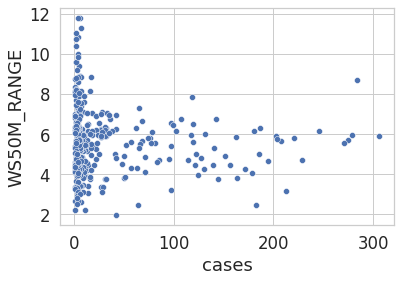

In [108]:
scatter_plot(df_taif, "cases", "WS50M_RANGE")

<AxesSubplot:xlabel='cases', ylabel='WS10M_RANGE'>

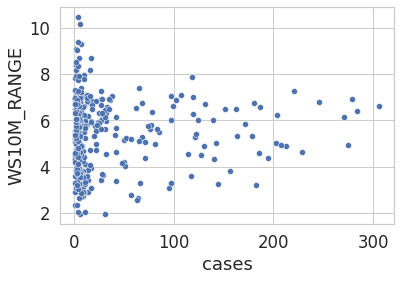

In [109]:
scatter_plot(df_taif, "cases", "WS10M_RANGE")

## Madinah

In [110]:
df_madina

,PRECTOT,RH2M,T2MDEW,T2M_MAX,T2M_MIN,T2M,WS50M_RANGE,WS10M_RANGE,cases,recoveries,mortalities
DATE,,,,,,,,,,,
2020-03-01,0.0,22.97,-2.91,28.93,9.67,18.74,3.55,4.05,NaN,NaN,NaN
2020-03-02,0.0,14.52,-9.58,28.81,8.30,17.90,7.59,6.70,NaN,NaN,NaN
2020-03-03,0.0,14.81,-7.59,31.14,9.82,20.08,5.39,5.50,NaN,NaN,NaN
2020-03-04,0.0,26.91,2.13,32.34,13.33,22.15,4.67,4.53,NaN,NaN,NaN
2020-03-05,0.0,34.73,6.83,32.10,16.06,23.37,5.84,3.49,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-03-12,0.0,25.35,4.24,34.59,18.27,25.60,9.27,8.87,10.0,2.0,1.0
2021-03-13,0.0,20.90,-1.11,32.92,12.44,22.39,6.94,6.36,3.0,1.0,1.0
2021-03-14,0.0,26.66,3.91,35.06,15.54,24.38,6.64,6.75,7.0,1.0,1.0


In [111]:
phase1_madina, phase2_madina = phase_mask(df_madina)

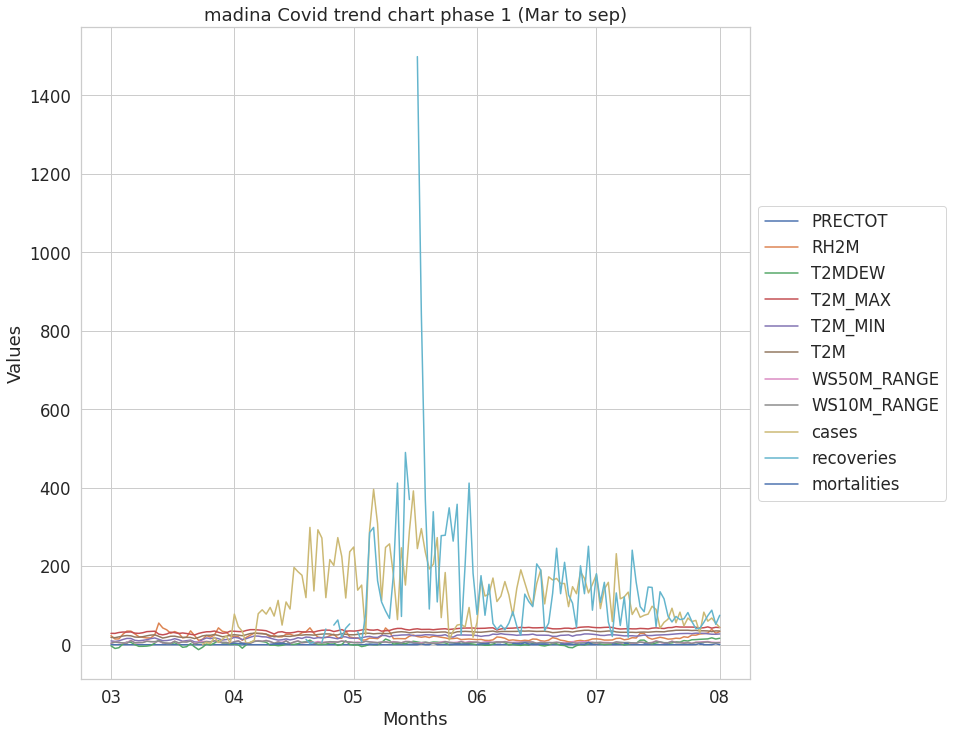

In [112]:
line_plot(phase1_madina, "madina Covid trend chart phase 1 (Mar to sep)");

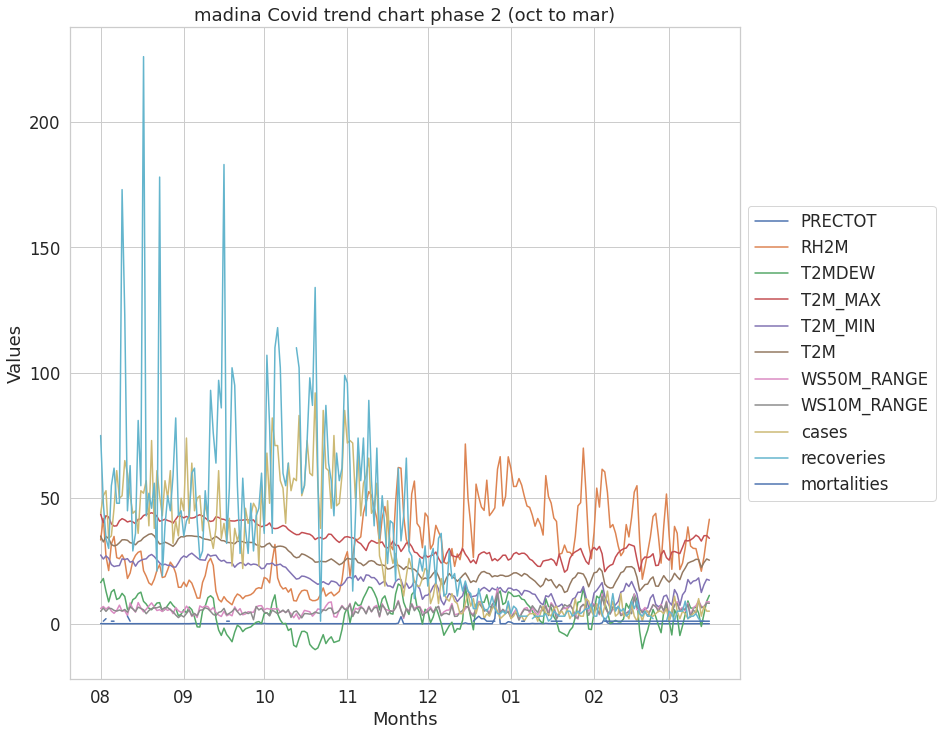

In [113]:
line_plot(phase2_madina, "madina Covid trend chart phase 2 (oct to mar)");

<AxesSubplot:xlabel='cases', ylabel='RH2M'>

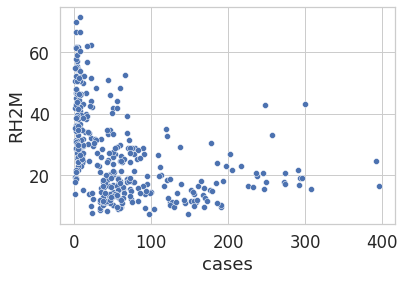

In [114]:
scatter_plot(df_madina, "cases", "RH2M")  

<AxesSubplot:xlabel='cases', ylabel='T2MDEW'>

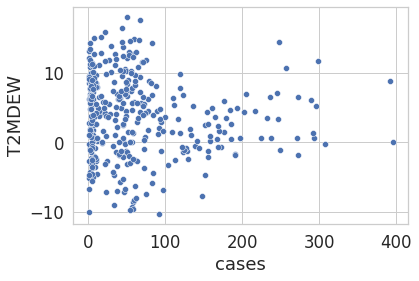

In [115]:
scatter_plot(df_madina, "cases", "T2MDEW")

<AxesSubplot:xlabel='cases', ylabel='T2M_MAX'>

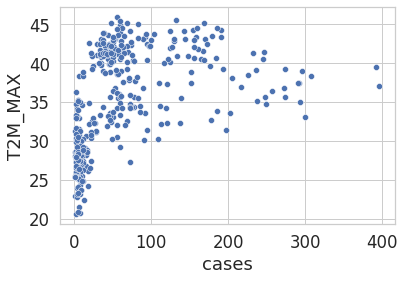

In [116]:
scatter_plot(df_madina, "cases", "T2M_MAX")

<AxesSubplot:xlabel='cases', ylabel='T2M_MIN'>

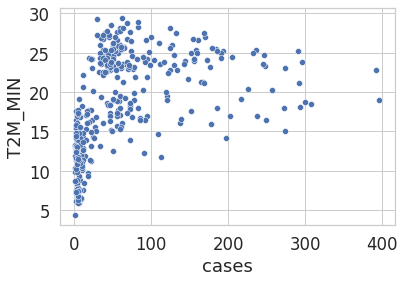

In [117]:
scatter_plot(df_madina, "cases", "T2M_MIN")

<AxesSubplot:xlabel='cases', ylabel='T2M'>

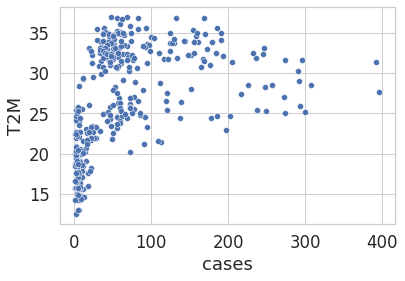

In [118]:
scatter_plot(df_madina, "cases", "T2M") 

<AxesSubplot:xlabel='cases', ylabel='WS50M_RANGE'>

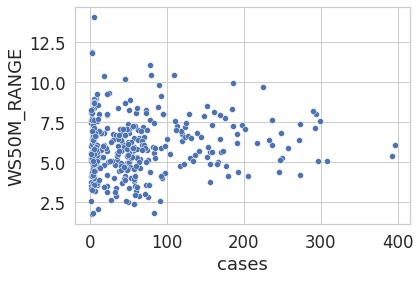

In [119]:
scatter_plot(df_madina, "cases", "WS50M_RANGE")

<AxesSubplot:xlabel='cases', ylabel='WS10M_RANGE'>

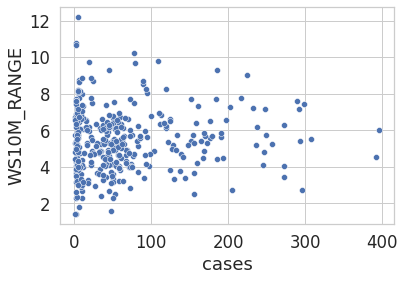

In [120]:
scatter_plot(df_madina, "cases", "WS10M_RANGE")

## Riyadh

In [121]:
df_riyadh

,PRECTOT,RH2M,T2M_RANGE,T2M_MAX,T2M_MIN,WS50M,WS10M,cases,recoveries,mortalities,Unnamed: 16
DATE,,,,,,,,,,,
2020-03-01,0.0,19.84,16.67,32.32,15.65,8.14,5.28,NaN,NaN,NaN,NaN
2020-03-02,0.0,25.41,14.27,24.93,10.67,7.05,5.09,NaN,NaN,NaN,NaN
2020-03-03,0.0,21.90,17.26,24.38,7.12,4.41,2.92,NaN,NaN,NaN,NaN
2020-03-04,0.0,21.29,17.02,26.40,9.39,3.84,2.69,NaN,NaN,NaN,NaN
2020-03-05,0.0,20.65,17.57,28.20,10.63,3.44,2.25,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-03-12,0.0,22.78,17.59,34.90,17.31,11.88,8.12,119.0,77.0,1.0,NaN
2021-03-13,0.0,33.72,13.86,25.49,11.64,5.79,3.82,121.0,82.0,1.0,NaN
2021-03-14,0.0,31.64,17.25,26.79,9.54,3.72,2.24,106.0,89.0,1.0,NaN


In [122]:
phase1_riyadh, phase2_riyadh = phase_mask(df_riyadh)

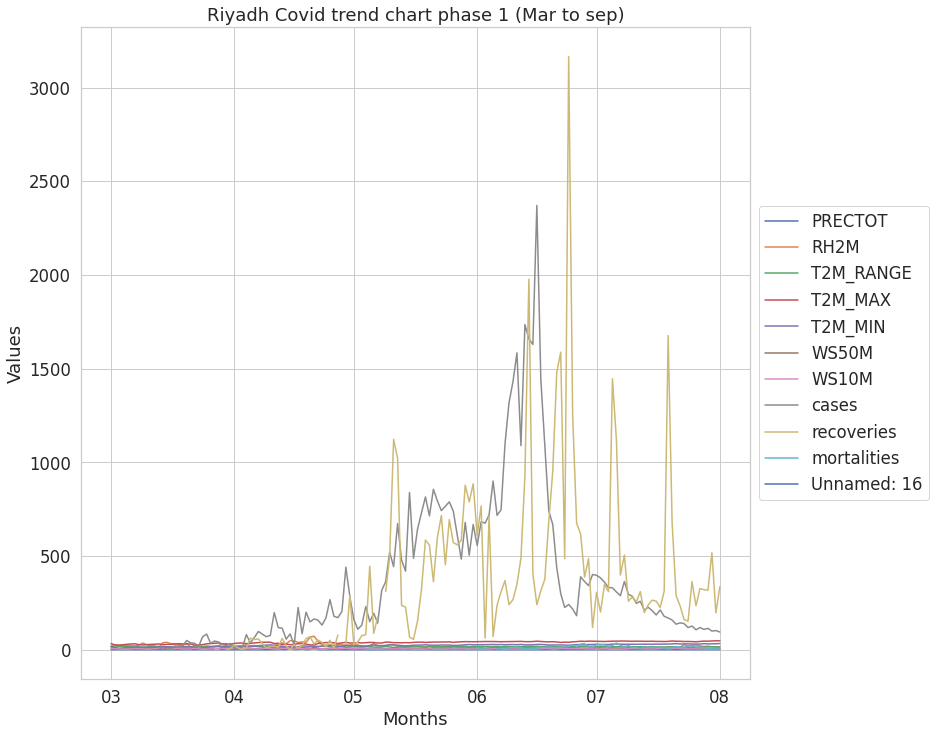

In [123]:
line_plot(phase1_riyadh, "Riyadh Covid trend chart phase 1 (Mar to sep)");

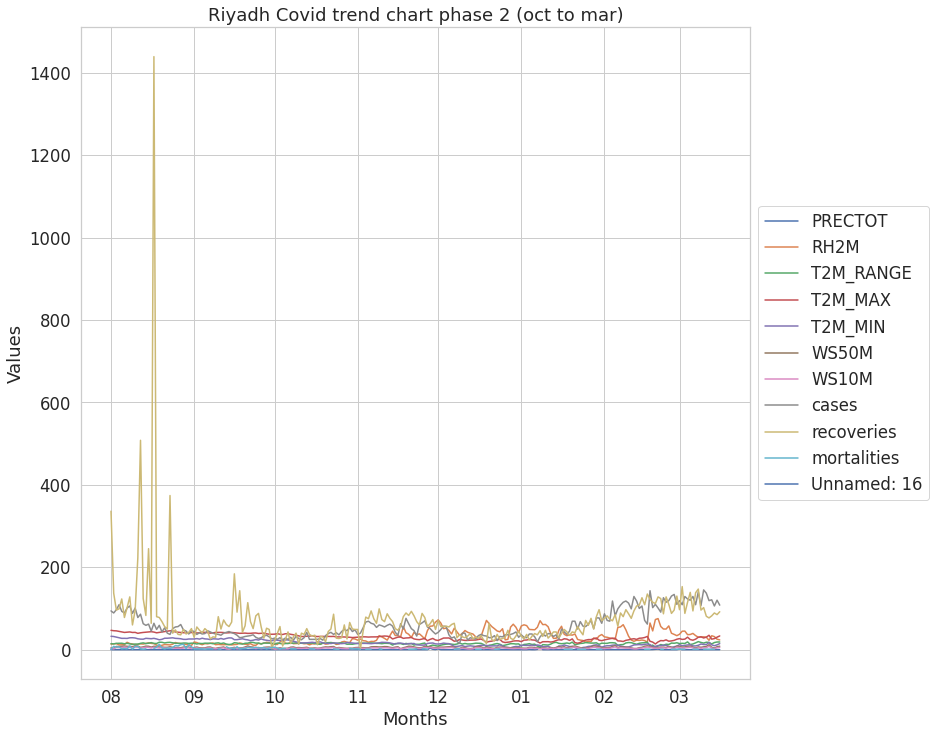

In [124]:
line_plot(phase2_riyadh, "Riyadh Covid trend chart phase 2 (oct to mar)");

<AxesSubplot:xlabel='cases', ylabel='RH2M'>

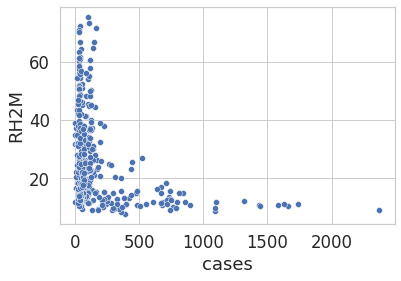

In [125]:
scatter_plot(df_riyadh, "cases", "RH2M")  

<AxesSubplot:xlabel='cases', ylabel='T2M_RANGE'>

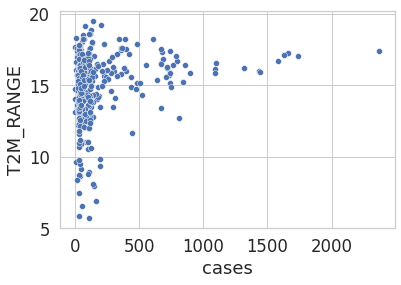

In [163]:
scatter_plot(df_riyadh, "cases", "T2M_RANGE")

<AxesSubplot:xlabel='cases', ylabel='T2M_MAX'>

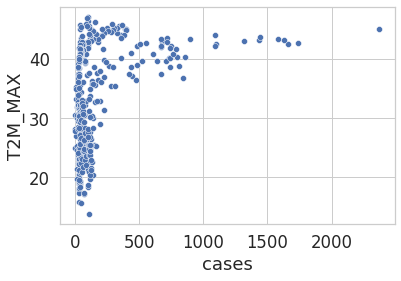

In [164]:
scatter_plot(df_riyadh, "cases", "T2M_MAX") 

<AxesSubplot:xlabel='cases', ylabel='T2M_MIN'>

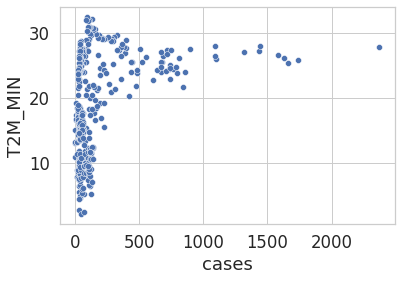

In [165]:
scatter_plot(df_riyadh, "cases", "T2M_MIN") 

<AxesSubplot:xlabel='cases', ylabel='WS10M'>

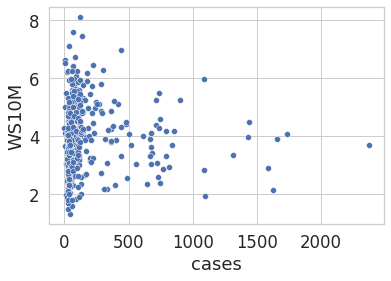

In [166]:
scatter_plot(df_riyadh, "cases", "WS10M") 

<AxesSubplot:xlabel='cases', ylabel='WS50M'>

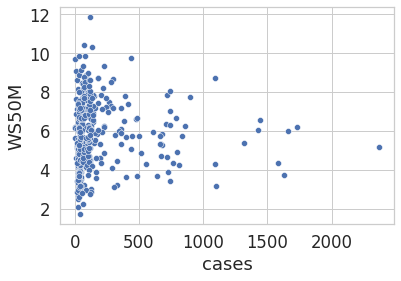

In [167]:
scatter_plot(df_riyadh, "cases", "WS50M") 

In [ ]:
# unavailible data for temperature dew point, wind speed in 10m/50m range, temperature
'''
scatter_plot(df_riyadh, "cases", "T2MDEW")
scatter_plot(df_riyadh, "cases", "WS10M_RANGE")
scatter_plot(df_riyadh, "cases", "WS50M_RANGE")
scatter_plot(df_riyadh, "cases", "T2M")
''';

## Dammam

In [168]:
df_dam

,PRECTOT,RH2M,T2MDEW,T2M_MAX,T2M_MIN,T2M,WS50M_RANGE,WS10M_RANGE,cases,recoveries,mortalities
DATE,,,,,,,,,,,
2020-03-01,0.0,57.94,12.32,26.02,16.19,20.82,5.00,2.89,NaN,NaN,NaN
2020-03-02,0.0,61.28,12.07,22.56,16.63,19.63,8.49,7.71,NaN,NaN,NaN
2020-03-03,0.0,59.57,10.68,21.96,16.34,18.62,4.44,4.22,NaN,NaN,NaN
2020-03-04,0.0,56.74,9.63,22.12,14.97,18.30,3.98,3.85,NaN,NaN,NaN
2020-03-05,0.0,61.78,11.49,23.35,15.23,18.90,4.70,3.57,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-03-12,0.0,36.41,9.71,32.35,19.95,25.81,8.29,5.87,10.0,5.0,NaN
2021-03-13,0.0,50.32,10.37,24.16,17.54,21.06,6.54,4.97,10.0,7.0,NaN
2021-03-14,0.0,50.69,8.80,23.04,16.22,19.25,5.27,3.64,18.0,9.0,1.0


In [169]:
phase1_dam, phase2_dam = phase_mask(df_dam)

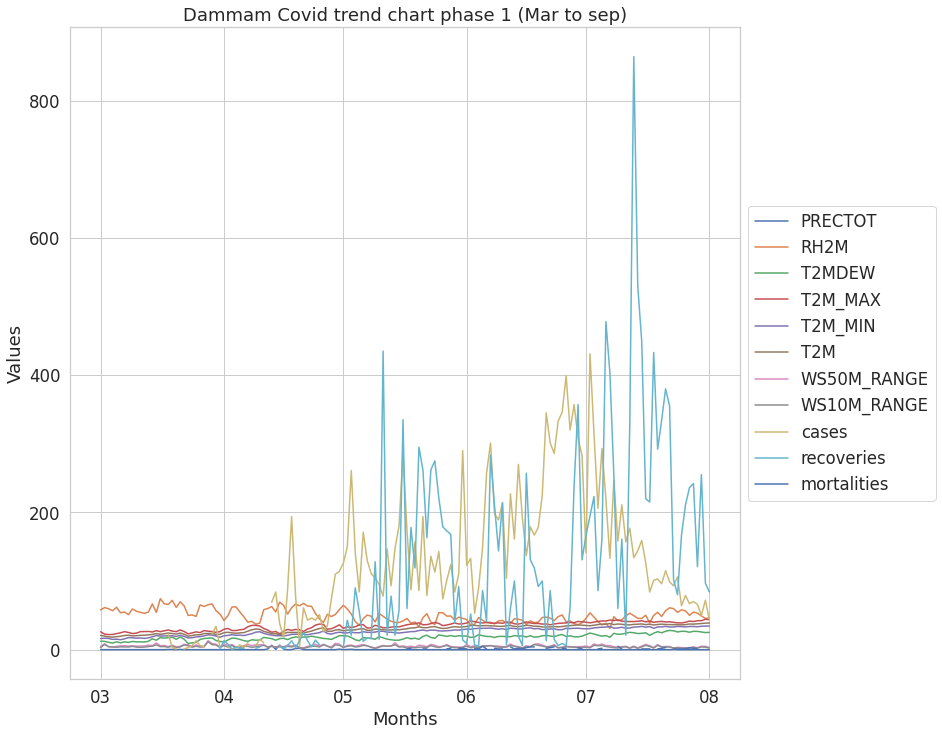

In [170]:
line_plot(phase1_dam, "Dammam Covid trend chart phase 1 (Mar to sep)");

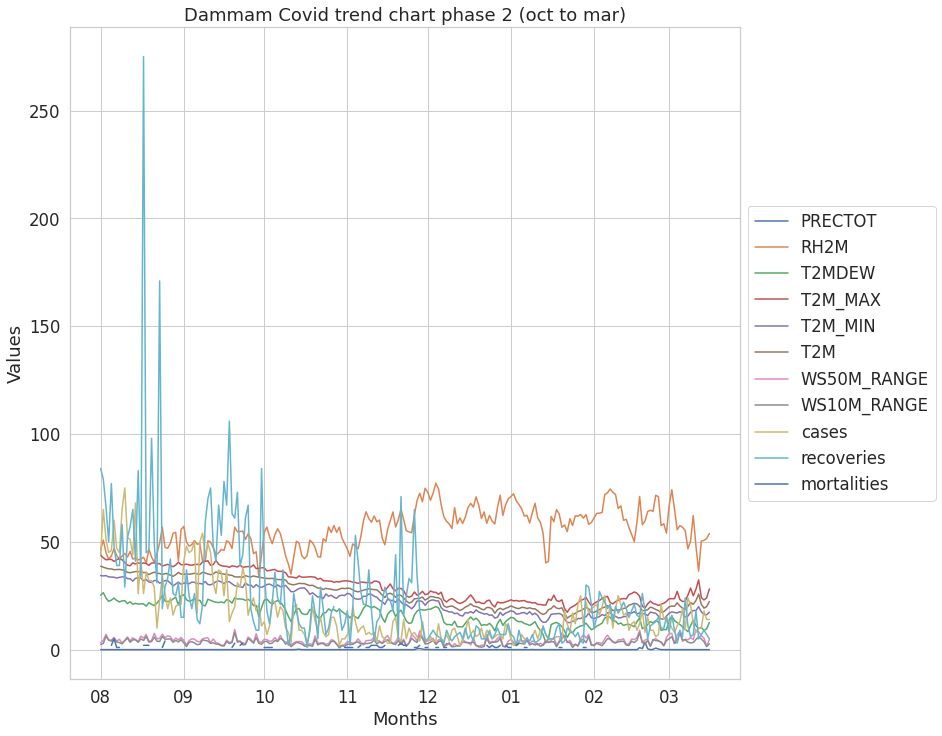

In [171]:
line_plot(phase2_dam, "Dammam Covid trend chart phase 2 (oct to mar)");

<AxesSubplot:xlabel='cases', ylabel='RH2M'>

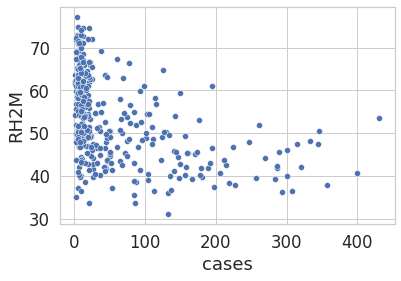

In [172]:
scatter_plot(df_dam, "cases", "RH2M")  

<AxesSubplot:xlabel='cases', ylabel='T2MDEW'>

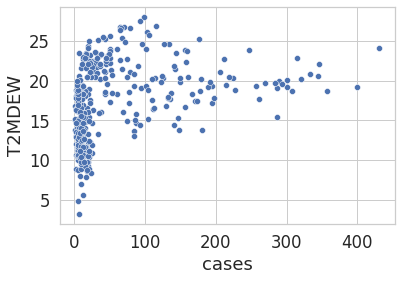

In [173]:
scatter_plot(df_dam, "cases", "T2MDEW")

<AxesSubplot:xlabel='cases', ylabel='T2M_MAX'>

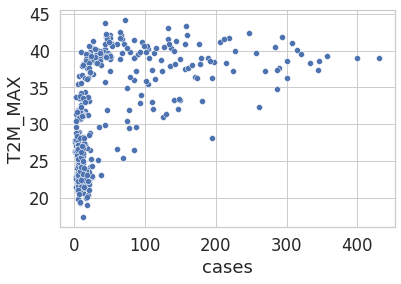

In [174]:
scatter_plot(df_dam, "cases", "T2M_MAX") 

<AxesSubplot:xlabel='cases', ylabel='T2M_MIN'>

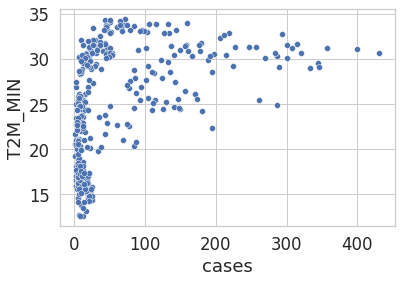

In [175]:
scatter_plot(df_dam, "cases", "T2M_MIN") 

<AxesSubplot:xlabel='cases', ylabel='T2M'>

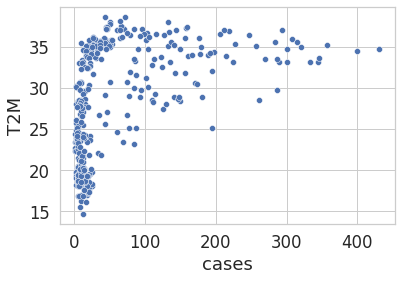

In [176]:
scatter_plot(df_dam, "cases", "T2M") 

<AxesSubplot:xlabel='cases', ylabel='WS50M_RANGE'>

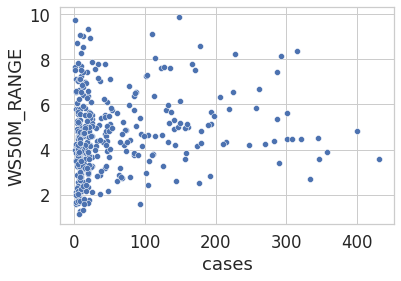

In [177]:
scatter_plot(df_dam, "cases", "WS50M_RANGE")

<AxesSubplot:xlabel='cases', ylabel='WS10M_RANGE'>

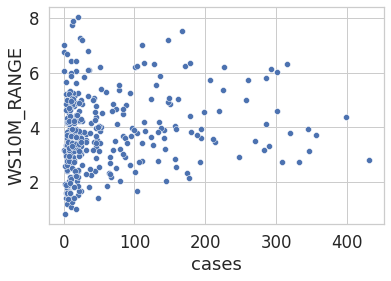

In [178]:
scatter_plot(df_dam, "cases", "WS10M_RANGE")

## Hofuf

In [179]:
df_hofuf

,PRECTOT,RH2M,T2MDEW,T2M_MAX,T2M_MIN,T2M,WS50M_RANGE,WS10M_RANGE,cases,recoveries,mortalities
DATE,,,,,,,,,,,
2020-03-01,0.0,26.36,0.98,30.45,13.16,21.14,4.94,3.26,NaN,NaN,NaN
2020-03-02,0.0,38.37,4.72,25.90,13.05,19.35,8.59,8.34,NaN,NaN,NaN
2020-03-03,0.0,44.15,4.44,24.44,10.37,16.76,4.08,4.58,NaN,NaN,NaN
2020-03-04,0.0,32.09,-0.05,24.97,9.90,16.84,4.52,4.85,NaN,NaN,NaN
2020-03-05,0.0,34.46,1.41,26.08,10.20,17.37,4.18,3.49,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-03-12,0.0,15.25,-1.07,37.07,19.76,27.73,6.83,7.66,22.0,7.0,1.0
2021-03-13,0.0,30.98,3.55,27.31,14.97,21.51,8.47,6.56,10.0,13.0,NaN
2021-03-14,0.0,29.22,-0.35,25.67,11.48,17.96,4.74,4.46,15.0,7.0,NaN


In [180]:
phase1_hofuf, phase2_hofuf = phase_mask(df_hofuf)

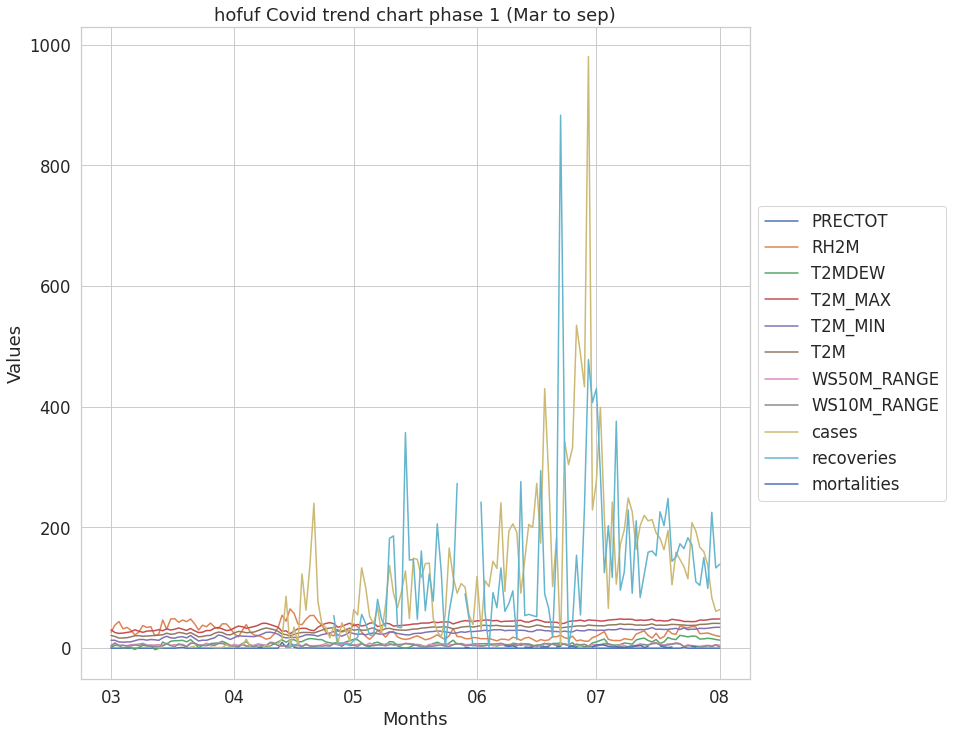

In [181]:
line_plot(phase1_hofuf, "hofuf Covid trend chart phase 1 (Mar to sep)");

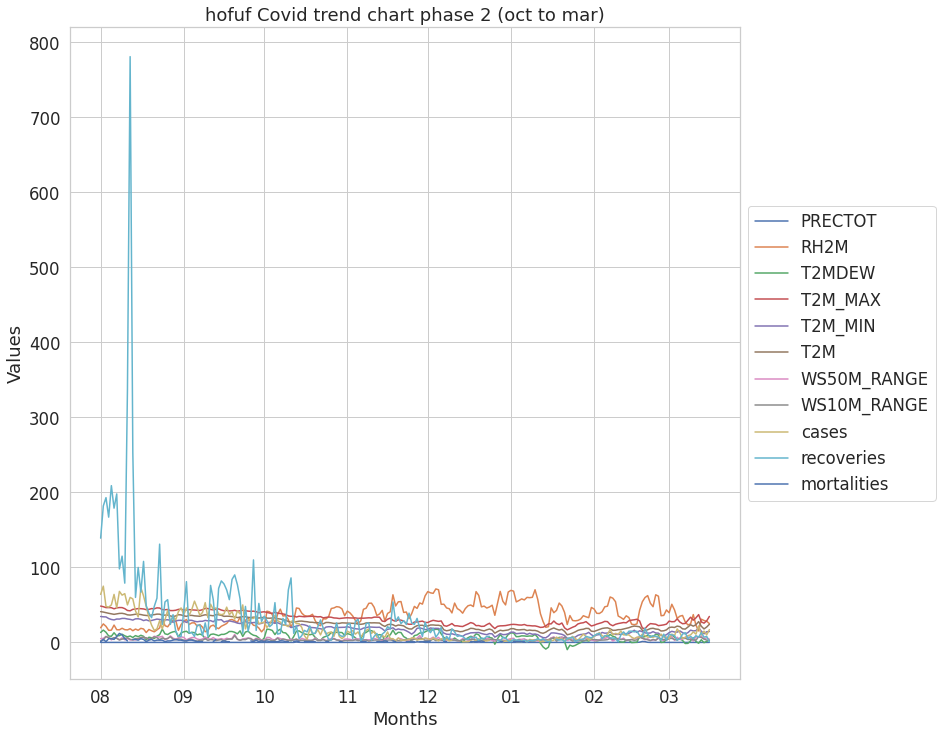

In [182]:
line_plot(phase2_hofuf, "hofuf Covid trend chart phase 2 (oct to mar)");

<AxesSubplot:xlabel='cases', ylabel='RH2M'>

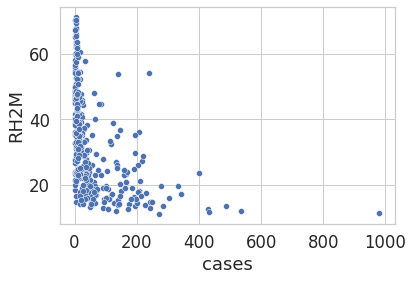

In [183]:
scatter_plot(df_hofuf, "cases", "RH2M") 

<AxesSubplot:xlabel='cases', ylabel='T2MDEW'>

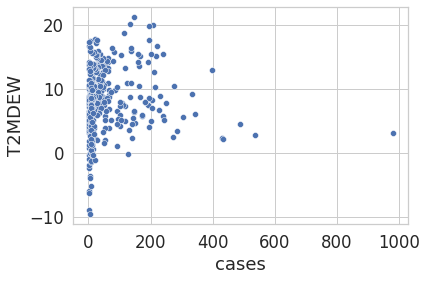

In [184]:
scatter_plot(df_hofuf, "cases", "T2MDEW")

<AxesSubplot:xlabel='cases', ylabel='T2M_MAX'>

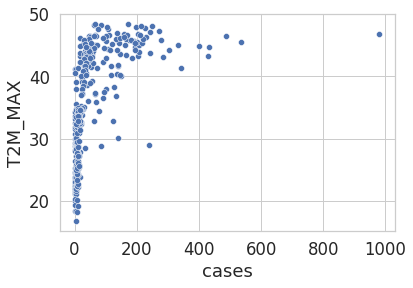

In [185]:
scatter_plot(df_hofuf, "cases", "T2M_MAX") 

<AxesSubplot:xlabel='cases', ylabel='T2M_MIN'>

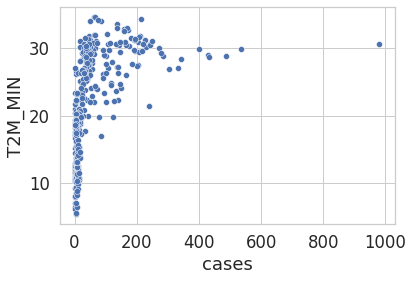

In [186]:
scatter_plot(df_hofuf, "cases", "T2M_MIN") 

<AxesSubplot:xlabel='cases', ylabel='T2M'>

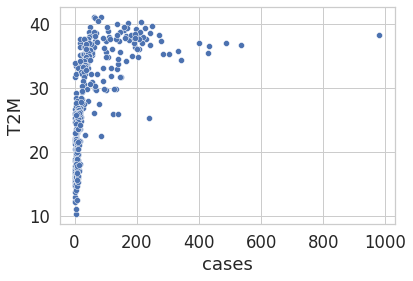

In [187]:
scatter_plot(df_hofuf, "cases", "T2M")

<AxesSubplot:xlabel='cases', ylabel='WS50M_RANGE'>

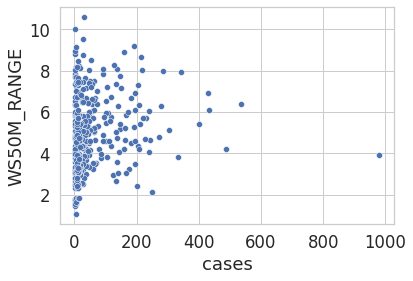

In [188]:
scatter_plot(df_hofuf, "cases", "WS50M_RANGE")

<AxesSubplot:xlabel='cases', ylabel='WS10M_RANGE'>

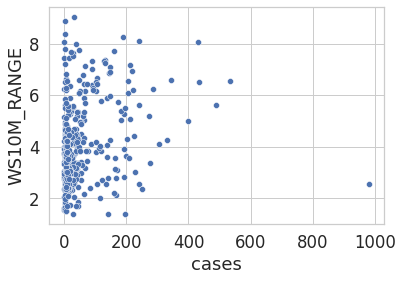

In [189]:
scatter_plot(df_hofuf, "cases", "WS10M_RANGE")

## Jubail

In [190]:
df_jubail

,PRECTOT,RH2M,T2MDEW,T2M_MAX,T2M_MIN,T2M,WS50M_RANGE,WS10M_RANGE,cases,recoveries,mortalities
DATE,,,,,,,,,,,
2020-03-01,0.00,50.23,10.43,27.75,15.50,21.17,5.94,5.22,NaN,NaN,NaN
2020-03-02,0.00,55.92,10.26,22.47,15.57,19.20,4.46,5.15,NaN,NaN,NaN
2020-03-03,0.00,55.50,9.08,22.04,15.15,18.07,4.99,5.07,NaN,NaN,NaN
2020-03-04,0.00,51.66,7.77,22.29,13.96,17.84,4.20,4.62,NaN,NaN,NaN
2020-03-05,0.00,54.79,9.37,23.92,14.27,18.58,6.31,4.46,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-03-12,0.00,33.42,8.39,34.08,18.80,25.78,9.87,7.37,7.0,1.0,NaN
2021-03-13,0.00,45.99,8.21,24.12,16.19,20.22,7.14,5.71,3.0,3.0,NaN
2021-03-14,0.00,45.02,6.25,23.22,14.55,18.42,5.51,3.72,2.0,2.0,NaN


In [191]:
phase1_jubail, phase2_jubail = phase_mask(df_jubail)

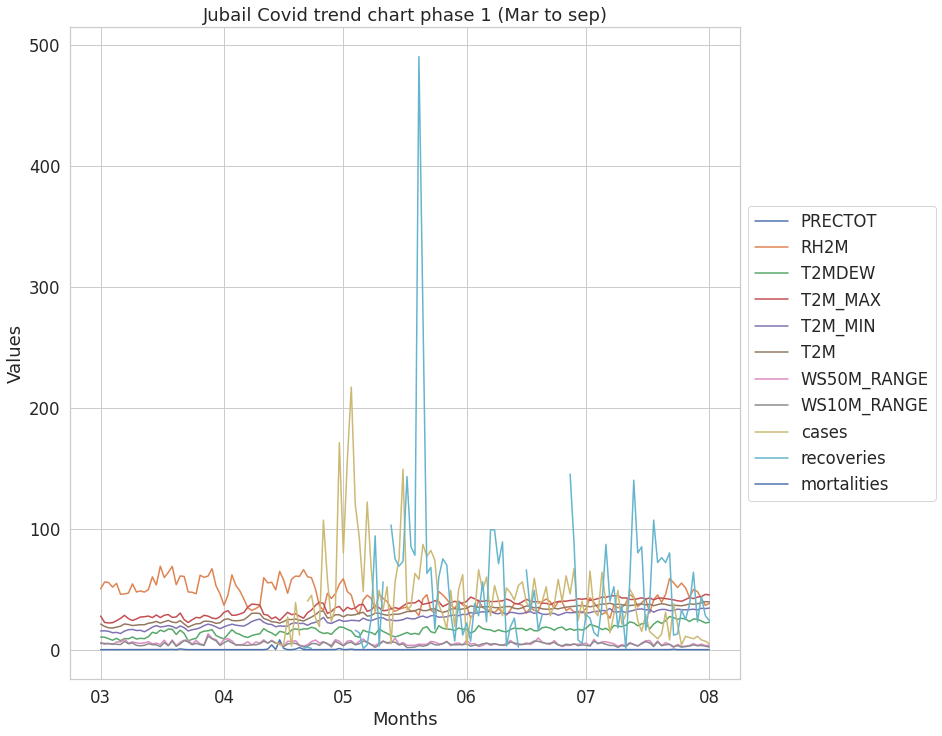

In [192]:
line_plot(phase1_jubail, "Jubail Covid trend chart phase 1 (Mar to sep)");


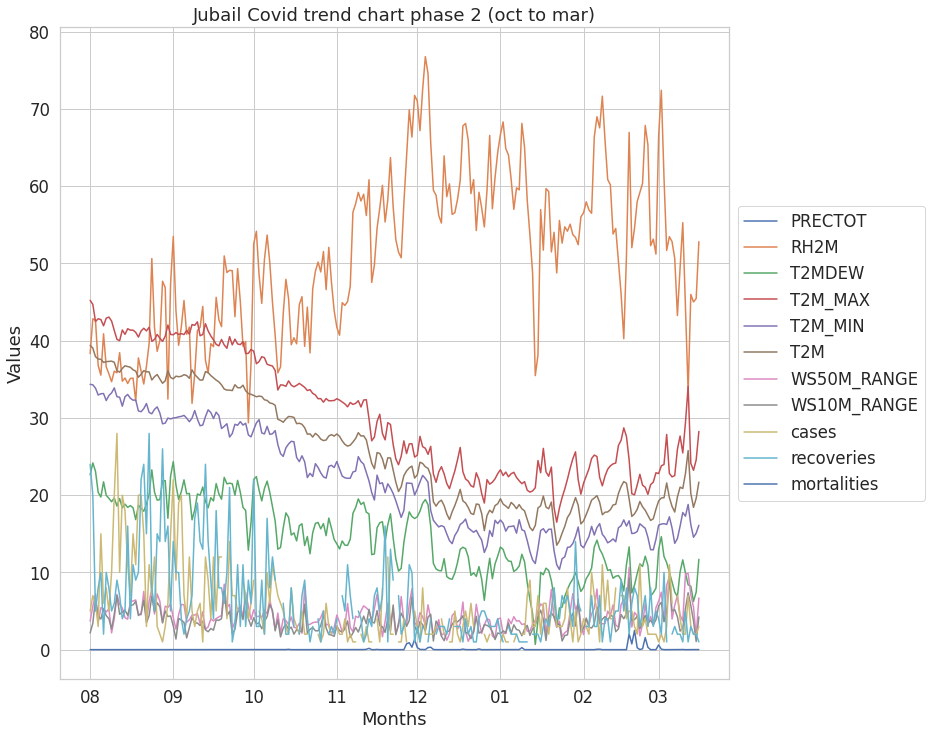

In [193]:
line_plot(phase2_jubail, "Jubail Covid trend chart phase 2 (oct to mar)");


<AxesSubplot:xlabel='cases', ylabel='RH2M'>

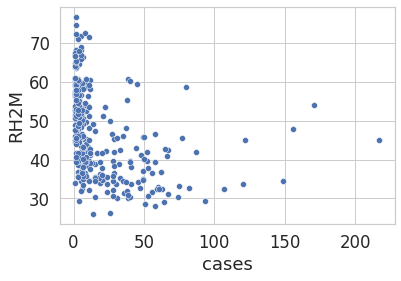

In [194]:
scatter_plot(df_jubail, "cases", "RH2M") 


<AxesSubplot:xlabel='cases', ylabel='T2MDEW'>

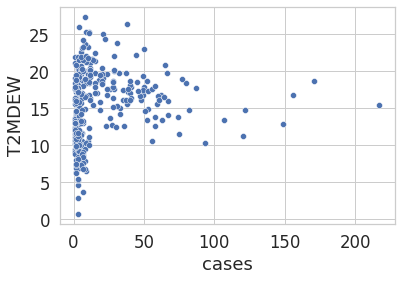

In [195]:
scatter_plot(df_jubail, "cases", "T2MDEW")


<AxesSubplot:xlabel='cases', ylabel='T2M_MAX'>

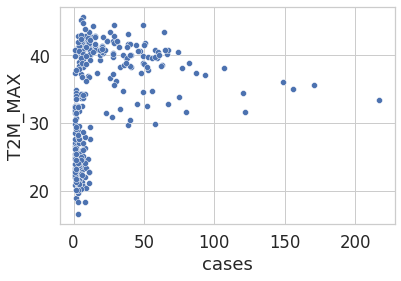

In [196]:
scatter_plot(df_jubail, "cases", "T2M_MAX") 


<AxesSubplot:xlabel='cases', ylabel='T2M_MIN'>

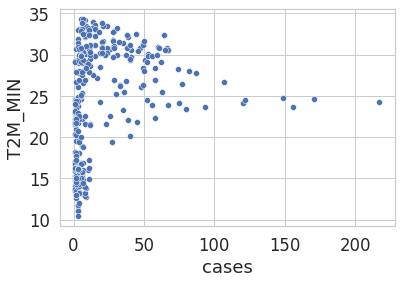

In [197]:
scatter_plot(df_jubail, "cases", "T2M_MIN") 


<AxesSubplot:xlabel='cases', ylabel='T2M'>

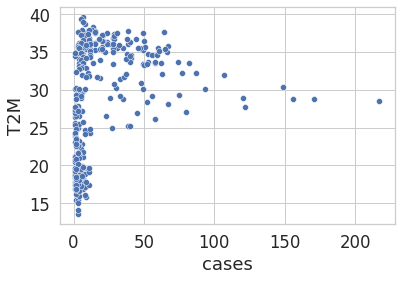

In [198]:
scatter_plot(df_jubail, "cases", "T2M")


<AxesSubplot:xlabel='cases', ylabel='WS50M_RANGE'>

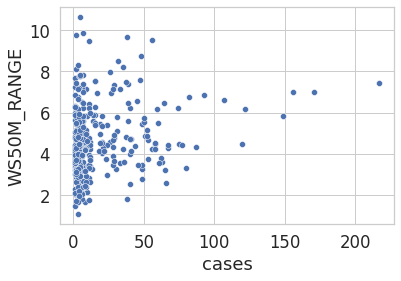

In [199]:
scatter_plot(df_jubail, "cases", "WS50M_RANGE")


<AxesSubplot:xlabel='cases', ylabel='WS10M_RANGE'>

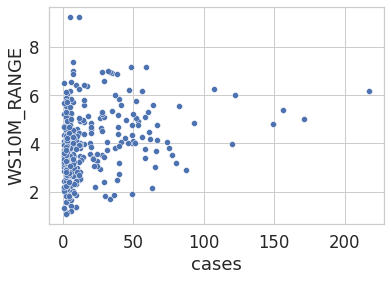

In [200]:
scatter_plot(df_jubail, "cases", "WS10M_RANGE")